In [1]:
#          ###########################################################################################
#          #                                      IN THE NAME OF ALLAH                               #
#          #   SENSITIVITY ANALYSIS STRUCTURE DUCTILITY DAMAGE INDEX OF TRUSS BRIDGE SUPERSTRUCTURE  #
#          #-----------------------------------------------------------------------------------------#
#          #                        THIS PROGRAM WRITTEN BY SALAR DELAVAR QASHQAI                    #
#          #                             EMAIL: salar.d.ghashghaei@gmail.com                         #
#          ###########################################################################################

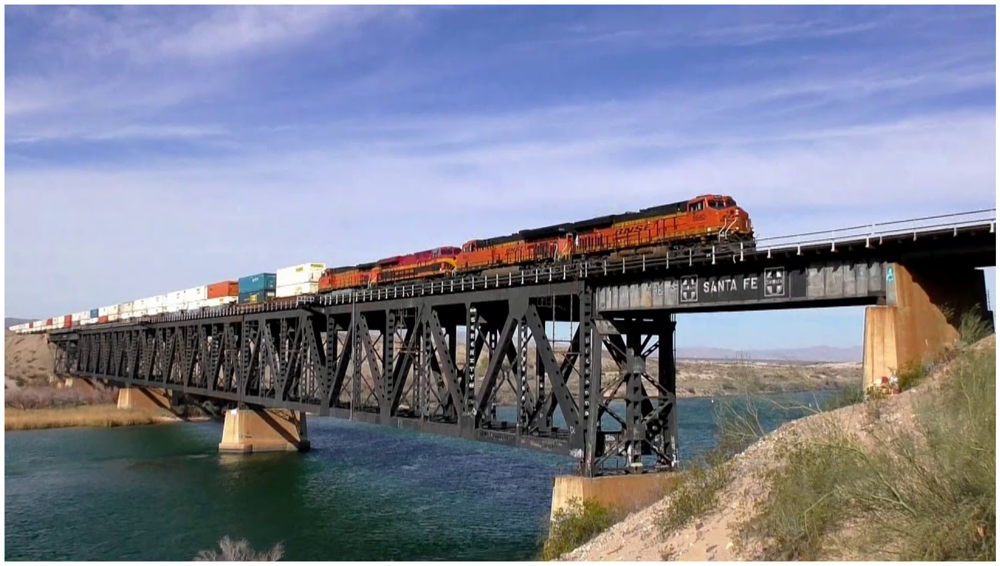

In [2]:
# Load the image
def PLOT_IMAGE(image):
    import matplotlib.pyplot as plt
    import matplotlib.image as mpimg
    image = mpimg.imread(image_path)

    # Display the image
    plt.figure(figsize=(30, 16))
    plt.imshow(image)
    plt.axis('off')  # Hide axes
    plt.show()
    
image_path = 'OPENSEES_RAILROAD_TRUSS_BRIDGE.png'    
PLOT_IMAGE(image_path)

In [2]:
#import the os module
import os
import math
import time
import numpy as np
import openseespy.opensees as op

In [3]:
#to create a directory at specified path with name "Data"
os.mkdir('C:\\OPENSEESPY_SALAR')

FileExistsError: [WinError 183] Cannot create a file when that file already exists: 'C:\\OPENSEESPY_SALAR'

In [4]:
FOLDER_NAME = 'TRUSS_SENSITIVITY'
dir = f"C:\\OPENSEESPY_SALAR\\{FOLDER_NAME}\\"
if not os.path.exists(dir):
    os.makedirs(dir)

In [5]:
## DELETE ALL FILES IN DIRECTORY 
def DELETE_FOLDER_CONTANTS(folder_path):
    import os
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        try:
            if os.path.isfile(file_path) or os.path.islink(file_path):
                os.unlink(file_path)
        except Exception as e:
            print(f"Failed to delete {file_path}. Reason: {e}")
    print("Deletion done")
   
FOLDER_PATH = f'C:\\OPENSEESPY_SALAR\\{FOLDER_NAME}'  # Specify the folder path
#DELETE_FOLDER_CONTANTS(FOLDER_PATH)   

In [6]:
def HISROGRAM_BOXPLOT(X, HISTO_COLOR, LABEL):
    import numpy as np
    import matplotlib.pyplot as plt
    X = np.array(X)
    print("-------------------------")
    from scipy.stats import skew, kurtosis
    MINIMUM = np.min(X)
    MAXIMUM = np.max(X)
    #MODE = max(set(X), key=list(X).count)
    MEDIAN = np.quantile(X, .50)#q2
    MEAN = np.mean(X)
    STD = np.std(X)
    q1 = np.quantile(X, .25)
    q3 = np.quantile(X, .75)
    SKEW = skew(X)
    KURT = kurtosis(X)
    #SKEW = (MEAN - MODE) / STD
    #KURT = (np.mean((X - MEAN)**4) / STD**4)
    # Estimate confidence intervals of the output variable
    lower_bound = np.quantile(X, .05)
    upper_bound = np.quantile(X, .95)
    print("Box-Chart Datas: ")
    print(f'Minimum: {MINIMUM:.4f}')
    print(f'First quartile: {q1:.4f}')
    #print(f'Mode: {MODE:.4f}')
    print(f'Median: {MEDIAN:.4f}')
    print(f'Mean: {MEAN:.4f}')
    print(f'Std: {STD:.4f}')
    print(f'Third quartile: {q3:.4f}')
    print(f'Maximum: {MAXIMUM :.4f}')
    print(f'Skewness: {skew(X) :.4f}')
    print(f'kurtosis: {kurtosis(X) :.4f}')
    print(f"90% Confidence Interval: ({lower_bound:.4f}, {upper_bound:.4f})")
    print("-------------------------")

    plt.figure(figsize=(10,6))
    # Plot histogram of data
    count, bins, ignored = plt.hist(X, bins=100, color=HISTO_COLOR, density=True, align='mid')#, edgecolor="black"
    
    # Plot lognormal PDF
    x = np.linspace(min(bins), max(bins), 10000)
    pdf = (np.exp(-(x - MEAN)**2 / (2 * STD**2)) / (STD * np.sqrt(2 * np.pi)))
    plt.plot(x, pdf, linewidth=2, color='r', label="Normal PDF")
    
    # Plot vertical lines for risk measures
    plt.axvline(q1, color="black", linestyle="--", label=f"Quantile 0.25: {q1:.4f}")
    plt.axvline(MEDIAN, color="green", linestyle="--", label=f"Median: {MEDIAN:.4f}")
    plt.axvline(q3, color="black", linestyle="--", label=f"Quantile 0.75: {q3:.4f}")
    #plt.axvline(MODE, color="purple", linestyle="--", label=f"Mode: {MODE:.4f}")
    plt.axvline(MEAN, color="red", linestyle="--", label=f"Mean: {MEAN:.4f}")
    plt.axvline(MEAN-STD, color="blue", linestyle="--", label=f"Mean-Std: {MEAN-STD:.4f}")
    plt.axvline(MEAN+STD, color="blue", linestyle="--", label=f"Mean+Std: {MEAN+STD:.4f}")
    plt.xlabel(LABEL)
    plt.ylabel("Frequency")
    prob = np.sum(X > 0) / len(X)
    plt.title(f"Histogram - Probability of Positive {LABEL} is {100*prob:.2f} %")
    plt.legend()
    #plt.grid()
    plt.show()

    #Plot boxplot with outliers
    plt.figure(figsize=(10,6))
    plt.boxplot(X, vert=0)
    # Write the quartile data on the chart
    plt.text(q1, 1.05, f" Q1: {q1:.4f}")
    plt.text(MEDIAN, 1.1, f" Q2: {MEDIAN:.4f}")
    plt.text(q3, 1.05, f" Q3: {q3:.4f}")
    #plt.text(MODE, 1.15, f" Mode: {MODE:.4f}")
    
    #plt.text(MEAN, 0.9, f" Mean: {MEAN:.4f}")
    #plt.text(MEAN-STD, 0.9, f" Mean-Std: {MEAN-STD:.4f}")
    #plt.text(MEAN+STD, 0.9, f" Mean+Std: {MEAN+STD:.4f}")
    plt.scatter(MEAN, 1, color="red", marker="+", s=200, label=f"Mean: {MEAN:.4f}")
    plt.scatter(MEAN-STD, 1, color="green", marker="X", s=200, label=f"Mean-Std: {MEAN-STD:.4f}")
    plt.scatter(MEAN+STD, 1, color="blue", marker="*", s=200, label=f"Mean+Std:  {MEAN+STD:.4f}")
    plt.xlabel(LABEL)
    plt.ylabel("Data")
    plt.title(f"Boxplot of {LABEL}")
    plt.legend()
    plt.grid()
    plt.show()
# -----------------------------------------------    
def HISTOGRAM_BOXPLOT_PLOTLY( DATA, XLABEL='X', TITLE='A', COLOR='cyan'):
    # Plotting histogram and boxplot
    import plotly.express as px
    fig = px.histogram(x=DATA, marginal="box", color_discrete_sequence=[COLOR])
    fig.update_layout(title=TITLE, xaxis_title=XLABEL, yaxis_title="Frequency")
    fig.show()     
# -----------------------------------------------
def PLOT_TIME_HIS(x, xlabel, y1, y1label, y2, y2label, y3, y3label, y4, y4label, Z, LOGX, LOGY):
    ## PLOT THE DATA
    import numpy as np
    import matplotlib.pyplot as plt
    # Define colors for each dataset
    colors = ['b', 'g', 'r', 'c']

    # Create subplots based on the value of Z
    fig, axs = plt.subplots(Z, 1, figsize=(14, 14))

    # Plot each dataset with a different color
    for i, y_data in enumerate([y1, y2, y3, y4][:Z]):
        axs[i].plot(x, y_data, color=colors[i])
        axs[i].set_title(f"{[y1label, y2label, y3label, y4label][i]} - MAX ABS: {np.max(np.abs(y_data)):.6e}")
        axs[i].set_xlabel(xlabel)
        #axs[i].set_ylabel()
        axs[i].grid()
        if LOGX == 1:
            axs[i].semilogx()
        if LOGY == 1:
            axs[i].semilogy()    

    # Adjust layout
    plt.tight_layout()
    plt.show()  
# -----------------------------------------------    
def MAXABS_FUN(DATA_FILE, COLUMN, I, J, Z):
    import numpy as np
    # Read and process displacement data
    if Z == 1:
        NameFiles = DATA_FILE
        filename = f"{NameFiles}_{I}.txt"
        D = np.loadtxt(filename)
        #print(D)
        MAXABS = np.max(np.abs([D[:, COLUMN]]))
    if Z == 2:
        NameFiles = DATA_FILE
        filename = f"{NameFiles}_{I}_{J}.txt"
        D = np.loadtxt(filename)
        #print(D)
        MAXABS = np.max(np.abs([D[:, COLUMN]]))    
    #print("MAX. ABS. :", MAXABS)
    return MAXABS
# -----------------------------------------------
def PLOT_2D(X, Y, Xfit, Yfit, XLABEL, YLABEL, TITLE, COLOR, Z):
    import matplotlib.pyplot as plt
    if Z == 1:
        # Plot 1 line
        plt.figure(figsize=(12, 8))
        plt.plot(X, Y,color=COLOR)
        plt.xlabel(XLABEL)
        plt.ylabel(YLABEL)
        plt.title(TITLE)
        plt.grid(True)
        plt.show()
    if Z == 2:
        plt.plot(X, Y, Xfit, Yfit, 'r--', linewidth=3)
        plt.title(TITLE)
        plt.xlabel(XLABEL)
        plt.ylabel(YLABEL)
        plt.legend(['curve', 'bilinear fitted'], loc='lower right')
        plt.grid(True)
        plt.show()
# -----------------------------------------------
def OUTPUT_SECOND_COLUMN(FOLDER, X, COLUMN, I, Z):
    import numpy as np
    # Time History
    if Z == 1:
        filename = f"C:\\OPENSEESPY_SALAR\\{FOLDER}\\{X}.txt"
        data_collected = np.loadtxt(filename)
        X = data_collected[:, COLUMN]
    if Z == 2:
        filename = f"C:\\OPENSEESPY_SALAR\\{FOLDER}\\{X}_{I}.txt"
        data_collected = np.loadtxt(filename)
        X = data_collected[:, COLUMN]    
    return X 
# -----------------------------------------------
def BILNEAR_CURVE(Cur, Mom, SLOPE_NODE):
    import numpy as np
    # bilinear fitting
    SIZE = len(Mom)
    hh = np.zeros(SIZE-1)
    Aa = np.zeros(SIZE-1)
    for i in range(SIZE-1):
        hh[i] = Cur[i+1] - Cur[i]
        Aa[i] = (Mom[i] + Mom[i+1]) * 0.5 * hh[i]

    Area = sum(Aa)
    k0 = Mom[SLOPE_NODE] / Cur[SLOPE_NODE]
    fiy = (Mom[i+1] * max(Cur) * 0.5 - Area) / (Mom[i+1] * 0.5 - k0 * max(Cur) * 0.5)
    My = k0 * fiy
    X = np.array([0, fiy, max(Cur)])
    Y = np.array([0, My, Mom[i+1]])
    """
    print('+==========================+')
    print('=   Analysis curve fitted =')
    print('     Disp       Baser Shear')
    print('----------------------------')
    print(np.column_stack((X.T, Y.T)))
    print('+==========================+')
    """
    # EI and Ductility_Rito of Unconfined Section
    Elastic_ST = Y[1] / X[1]
    Plastic_ST = Y[2] / X[2]
    Tangent_ST = (Y[2] - Y[1]) / (X[2] - X[1])
    Ductility_Rito = X[2] / X[1]
    Over_Strength_Factor = Y[2] / Y[1]
    """
    print('+----------------------------------------------------+')
    print(f' Structure Elastic Stiffness :     {Elastic_ST:.2f}')
    print(f' Structure Plastic Stiffness :     {Plastic_ST:.2f}')
    print(f' Structure Tangent Stiffness :     {Tangent_ST:.2f}')
    print(f' Structure Ductility Ratio :       {Ductility_Rito:.2f}')
    print(f' Structure Over Strength Factor:   {Over_Strength_Factor:.2f}')
    print('+----------------------------------------------------+')
    """
    return X, Y, Elastic_ST, Plastic_ST, Tangent_ST, Ductility_Rito, Over_Strength_Factor
# -----------------------------------------------
def PLOT3D(X, Y, Z, XLABEL, YLABEL, ZLABEL, TITLE):
    import plotly.graph_objects as go
    # Create a 3D scatter plot
    fig = go.Figure(data=[go.Scatter3d(x=X, y=Y, z=Z, mode='markers', marker=dict(size=5, color=Z))])
    fig.update_layout(scene=dict(xaxis_title=XLABEL, yaxis_title=YLABEL, zaxis_title=ZLABEL), title=TITLE)
    fig.show()
# -----------------------------------------------     
# Create a scatter plot
def PLOT_SCATTER(X, Y , XLABEL, YLABEL, TITLE, COLOR, LOG, ORDER):
    import matplotlib.pyplot as plt
    # Calculate linear regression parameters
    import numpy as np
    coefficients = np.polyfit(X, Y, ORDER)
    if ORDER == 1:
        a, b = coefficients
    if ORDER == 2:
        a, b, c = coefficients    
    if ORDER == 3:
        a, b, c, d = coefficients   
    if ORDER == 4:
        a, b, c, d, e = coefficients  
    if ORDER == 5:
        a, b, c, d, e, f = coefficients  
    if ORDER == 6:
        a, b, c, d, e, f, I = coefficients   
    if ORDER == 7:
        a, b, c, d, e, f, I, J = coefficients     
    y = [];yy = [];
    for i in range(len(X)):
        if ORDER == 1:
            y.append(a * X[i] + b)
        if ORDER == 2:
            y.append(a * X[i]**2 + b * X[i] + c)
        if ORDER == 3:
            y.append(a * X[i]**3 + b * X[i]**2 + c * X[i] + d)    
        if ORDER == 4:
            y.append(a * X[i]**4 + b * X[i]**3 + c * X[i]**2 + d * X[i] + e)  
        if ORDER == 5:
            y.append(a * X[i]**5 + b * X[i]**4 + c * X[i]**3 + d * X[i]**2 + e * X[i] + f)    
        if ORDER == 6:
            y.append(a * X[i]**6 + b * X[i]**5 + c * X[i]**4 + d * X[i]**3 + e * X[i]**2 + f * X[i] + I)     
        if ORDER == 7:
            y.append(a * X[i]**7 + b * X[i]**6 + c * X[i]**5 + d * X[i]**4 + e * X[i]**3 + f * X[i]**2 + I * X[i] + J)     
        yy.append(Y[i] - y[-1])
    y = np.array(y)    
    yy = np.array(yy) 
    # Calculate TSS
    Y_mean = np.mean(Y)
    TSS = np.sum((Y - Y_mean) ** 2)
    # Calculate RSS
    RSS = np.sum(yy ** 2)
    # Calculate R-squared
    R_squared = 1 - (RSS / TSS)
    #print(f"R-squared value: {R_squared:.4f}")
    plt.figure(figsize=(10,6))
    plt.scatter(X, Y, color=COLOR, marker='o', label='Data')
    # Add labels and title
    plt.xlabel(XLABEL)
    plt.ylabel(YLABEL)
    # Add the linear regression line
    if ORDER == 1:
        plt.plot(X, y, color='black', label=f'y = {a:.2f}x + {b:.2f} - R^2 = {R_squared:.3f}')
    if ORDER == 2:
        plt.plot(X, y, color='black', label=f'y = {a:.2f}x^2 + {b:.2f}x + {c:.2f} - R^2 = {R_squared:.3f}')
    if ORDER == 3:
        plt.plot(X, y, color='black', label=f'y = {a:.2f}x^3 + {b:.2f}x^2 + {c:.2f}x + {d:.2f} - R^2 = {R_squared:.3f}')  
    if ORDER == 4:
        plt.plot(X, y, color='black', label=f'y = {a:.2f}x^4 + {b:.2f}x^3 + {c:.2f}x^2 + {d:.2f}x + {e:.2f} - R^2 = {R_squared:.3f}') 
    if ORDER == 5:
        plt.plot(X, y, color='black', label=f'y = {a:.2f}x^5 + {b:.2f}x^4 + {c:.2f}x^3 + {d:.2f}x^2 + {e:.2f}x + {f:.2f} - R^2 = {R_squared:.3f}')  
    if ORDER == 6:
        plt.plot(X, y, color='black', label=f'y = {a:.2f}x^6 + {b:.2f}x^5 + {c:.2f}x^4 + {d:.2f}x^3 + {e:.2f}x^2 + {f:.2f}x + {I:.2f} - R^2 = {R_squared:.3f}')  
    if ORDER == 7:
        plt.plot(X, y, color='black', label=f'y = {a:.2f}x^7 + {b:.2f}x^6 + {c:.2f}x^5 + {d:.2f}x^4 + {e:.2f}x^3 + {f:.2f}x^2 + {I:.2f}x + {J:.2f} - R^2 = {R_squared:.3f}')               
    
    plt.title(TITLE)
    plt.grid(True)
    plt.legend()
    if LOG == 1:
        plt.semilogx();plt.semilogy();
    plt.show()

# -----------------------------------------------
def PLOT_SCATTER_PLOTLY(X, Y, XLABEL, YLABEL, TITLE, COLOR, LOG, ORDER):
    import plotly.graph_objects as go
    import numpy as np
    # Calculate linear regression parameters
    coefficients = np.polyfit(X, Y, ORDER)
    y = np.polyval(coefficients, X)
    
    # Calculate residuals
    residuals = Y - y
    
    # Calculate TSS
    Y_mean = np.mean(Y)
    TSS = np.sum((Y - Y_mean) ** 2)
    
    # Calculate RSS
    RSS = np.sum(residuals ** 2)
    
    # Calculate R-squared
    R_squared = 1 - (RSS / TSS)
    
    # Create scatter plot
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=X, y=Y, mode='markers', marker=dict(color=COLOR), name='Data'))
    
    # Add the regression line
    fig.add_trace(go.Scatter(x=X, y=y, mode='lines', line=dict(color='black'),
                             name=f'Fit: R^2 = {R_squared:.3f}'))
    
    # Add labels and title
    fig.update_layout(
        title=TITLE,
        xaxis_title=XLABEL,
        yaxis_title=YLABEL,
        showlegend=True
    )
    
    # Set log scale if needed
    if LOG == 1:
        fig.update_xaxes(type="log")
        fig.update_yaxes(type="log")
    
    fig.show() 
# -----------------------------------------------
def plot_scatter_plotly(X, Y, XLABEL, YLABEL, TITLE, COLOR):
    import plotly.express as px
    fig = px.scatter(x=X, y=Y, color_discrete_sequence=[COLOR], labels={XLABEL: XLABEL, YLABEL: YLABEL})
    fig.update_layout(title=TITLE, xaxis_type='log', yaxis_type='log')
    fig.show() 
# ----------------------------------------------- 
def PLOT_HEATMAP(df):
    import plotly.figure_factory as ff
    # Calculate the correlation matrix
    corr_matrix = df.corr()

    # Create a correlation heatmap
    fig = ff.create_annotated_heatmap(
        z=corr_matrix.values,
        x=list(corr_matrix.columns),
        y=list(corr_matrix.index),
        annotation_text=corr_matrix.round(5).values,
        showscale=True,
        colorscale='Viridis'
    )

    # Update layout
    fig.update_layout(
        title='Correlation Heatmap',
        xaxis=dict(title='Variable'),
        yaxis=dict(title='Variable'),
        width=1200, height=1200
    )

    fig.show()
    
# -----------------------------------------------     
"""
Long short-term memory (LSTM) is a type
of recurrent neural network (RNN) aimed
at dealing with the vanishing gradient
problem present in traditional RNNs
"""
def PREDICT_LSTM(x, y, look_back, ITERATION):
    import numpy as np
    from keras.models import Sequential
    from keras.layers import LSTM, Dense
    # Prepare data for LSTM
    trainX, trainY = [], []
    for i in range(len(x) - look_back):
        trainX.append(x[i:i + look_back])
        trainY.append(y[i + look_back])

    trainX, trainY = np.array(trainX), np.array(trainY)

    # Build the LSTM model
    model = Sequential()
    model.add(LSTM(4, input_shape=(look_back, 1)))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    model.fit(trainX, trainY, epochs= ITERATION, batch_size=1, verbose=2)

    # Predict the next 'y' value
    next_x = np.array(x[-look_back:]).reshape(1, look_back, 1)
    predicted_y = model.predict(next_x)
    return predicted_y 

# -----------------------------------------------    
def Normal_CDF_Newton_Raphson(P_f, EPS=1e-3, tol=1e-6, max_iter=1000000):
    from scipy.stats import norm
    x = 0.0  # Initial guess (you can choose any value)
    
    for i in range(max_iter):
        xmin = x - EPS
        xmax = x + EPS
        f = norm.cdf(-x) - P_f
        fmin = norm.cdf(-xmin) - P_f
        fmax = norm.cdf(-xmax) - P_f
        df = (fmax - fmin) / (2 * EPS)
        dx = f / df
        f_prime_x = -norm.pdf(-x)
        
        if abs(dx) < tol:
            break
        
        x -= dx
    
    return x
# ----------------------------------------------- 
def MIX_HISTOGRAM(x, y, BINS, X, Y, TITLE):
    plt.figure(figsize=(8, 6))
    plt.hist(x, bins=BINS, alpha=0.5, label=X, color='blue')
    plt.hist(y, bins=BINS, alpha=0.5, label=Y, color='red')
    plt.legend(loc='upper right')
    plt.xlabel("Samples")
    plt.ylabel("Frequency")
    plt.title(TITLE)
    plt.show()
# -----------------------------------------------     
def plot_multiple_lines(x, y_list, LABELS, XLABEL, YLABEL, TITLE):
    import matplotlib.pyplot as plt
    """
    Plots multiple lines on the same graph.

    Parameters:
    x (list): List of x values.
    y_list (list of lists): List containing lists of y values for each line.
    labels (list): List of labels for each line.
    """
    for y, label in zip(y_list, LABELS):
        plt.plot(x, y, label=label)
    
    plt.xlabel(XLABEL)
    plt.ylabel(YLABEL)
    plt.title(TITLE)
    plt.legend()
    plt.grid()
    plt.show()
# -----------------------------------------------         
def STRENGTH_DAMAGE_INDEX(x, YIELD, ULTIMATE):
    DI = (x - YIELD) / (ULTIMATE - YIELD)
    return DI    

In [13]:
# pip install openseespy
# pip install --upgrade openseespy

In [7]:
# OUTPUT DATA ADDRESS:
SALAR_DIR = f'C://OPENSEESPY_SALAR//{FOLDER_NAME}//';

In [15]:
### -----------------------
###    PUSHOVER FUNCTION
### -----------------------

def PUSHOVER_ANALYSIS(nodes, elements, B_01, t_01, B_02, t_02, Fy, Fu, Weight, ND01, ND02, DMAX, I):
    import openseespy.opensees as op
    # Create a model builder
    op.wipe()
    op.model('basic', '-ndm', 2, '-ndf', 2)
    
    for i in range(0, 62):
        op.node(nodes[i][0], nodes[i][1], nodes[i][2])
    
    # Define boundary conditions
    op.fix(1, 1, 1)
    op.fix(11, 1, 1)
    op.fix(21, 1, 1)
    op.fix(31, 1, 1)
    
    SecTag01 = 1			# BOTTOM AND TOP TRUSS ELEMENTS
    SecTag02 = 2			# DIAGONAL TRUSS ELEMENTS
    # MATERIAL parameters -------------------------------------------------------------------
    IDreinf = 1; 				# material ID tag -- PLATE
    # PLATE MATERIAL PROPERTIES:
    Es = 200000			# Steel plate modulus of elasticity
    Cy = Fy/Es			# Steel plate yield strain
    Cu = 0.9			# Steel plate ultimate strain
    Esh = (Fu - Fy)/(Cu - Cy) # Steel plate tangent modulus of elasticity
    Bs = Esh / Es				# strain-hardening ratio 
    #Bs = 0.01				# strain-hardening ratio 
    R0 = 18.0				# control the transition from elastic to plastic branches
    cR1 = 0.925				# control the transition from elastic to plastic branches
    cR2 = 0.15				# control the transition from elastic to plastic branches
    # BOTTOM AND TOP TRUSS ELEMENTS
    op.uniaxialMaterial('Steel02', IDreinf, Fy, Es, Bs, R0,cR1,cR2) # build plate material
    # FIBER SECTION properties -------------------------------------------------------------
    # symmetric section
    #                        y
    #                        ^
    #                        |     
    #              _____________________    --  --
    #             |  _________________ |    |   -- tf
    #             | |                | |    |
    #             | |                | |    
    #    z <---   | |                | |    B
    #             | |                | |    
    #             | |________________| |    |
    #             |____________________|    |   -- tf
    #                                      --   --
    #             |-------- B ---------|
    #
    # STEEL BOX SECTION: 
    x01 = B_01 / 2.0
    y01 = B_01 / 2.0
    x02 = (B_01 - t_01) / 2.0
    y02 = (B_01 - t_01) / 2.0
    nfCoreY = 60;			# number of fibers for steel in y-direction
    nfCoreZ = 30;			# number of fibers for steel in z-direction
    op.section('Fiber', SecTag01)
    # Define the core patch
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, y02, x01, y02, -x01, y01, -x01, y01, x01) # TOP PLATE
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, -y02, x01, -y02, -x01, -y01, -x01, -y01, -x01) # BOTTOM PLATE
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, y02, x01, y02, x02, -y02, x02, -y02, x01) # MIDDLE RIGHT PLATE
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, y02, -x01, y02, -x02, -y02, -x02, -y02, -x01) # MIDDLE LEFT PLATE    
    # -----------------------------------------------------------------------------------------------------
    # DIAGONAL TRUSS ELEMENTS
    # FIBER SECTION properties -------------------------------------------------------------
    # symmetric section
    #                        y
    #                        ^
    #                        |     
    #              _____________________    --  --
    #             |  _________________ |    |   -- tf
    #             | |                | |    |
    #             | |                | |    
    #    z <---   | |                | |    B
    #             | |                | |    
    #             | |________________| |    |
    #             |____________________|    |   -- tf
    #                                      --   --
    #             |-------- B ---------|
    #
    # STEEL BOX SECTION: 
    x01 = B_02 / 2.0
    y01 = B_02 / 2.0
    x02 = (B_02 - t_02) / 2.0 
    y02 = (B_02 - t_02) / 2.0
    nfCoreY = 60;			# number of fibers for steel in y-direction
    nfCoreZ = 30;			# number of fibers for steel in z-direction
    op.section('Fiber', SecTag02)
    # Define the core patch
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, y02, x01, y02, -x01, y01, -x01, y01, x01) # TOP PLATE
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, -y02, x01, -y02, -x01, -y01, -x01, -y01, -x01) # BOTTOM PLATE
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, y02, x01, y02, x02, -y02, x02, -y02, x01) # MIDDLE RIGHT PLATE
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, y02, -x01, y02, -x02, -y02, -x02, -y02, -x01) # MIDDLE LEFT PLATE
    # -----------------------------------------------------------------------------------------------------
    for j in range(121):
        op.element('trussSection', elements[j][0], elements[j][1], elements[j][2], elements[j][3])
        # Recorder for element forces
        op.recorder('Element', '-file', f'{SALAR_DIR}PUSH_elementForces_{I}_{j}.txt', '-time', '-ele', elements[j][0], 'section', 1, 'force')
        # Recorder for element stress-strain
        op.recorder('Element', '-file', f'{SALAR_DIR}PUSH_fiber_StressStrain_{I}_{j}.txt', '-time', '-ele', elements[j][0], 'section', 1,'fiber', y01, x01,'stressStrain')# steel fiber    
    # Recorder for node displacements
    for j in range(62):
        op.recorder('Node', '-file', f'{SALAR_DIR}PUSH_nodeDisplacements_{I}_{j}.txt','-time', '-node', nodes[j][0], '-dof', 1,2, 'disp')# Displacement Time History
    
    
    #import InelasticFiberSection
    op.recorder('Node', '-file', f"{SALAR_DIR}DTH_PUSH_{I}.txt",'-time', '-node', ND01, '-dof', 1,2, 'disp')# Displacement Time History Node 2
    op.recorder('Node', '-file', f"{SALAR_DIR}BTH_PUSH_01_{I}.txt",'-time', '-node', 1, '-dof', 1,2, 'reaction')# Base Shear Time History Node 1
    op.recorder('Node', '-file', f"{SALAR_DIR}BTH_PUSH_11_{I}.txt",'-time', '-node', 11, '-dof', 1,2, 'reaction')# Base Shear Time History Node 3
    op.recorder('Node', '-file', f"{SALAR_DIR}BTH_PUSH_21_{I}.txt",'-time', '-node', 21, '-dof', 1,2, 'reaction')# Base Shear Time History Node 3
    op.recorder('Node', '-file', f"{SALAR_DIR}BTH_PUSH_31_{I}.txt",'-time', '-node', 31, '-dof', 1,2, 'reaction')# Base Shear Time History Node 3
    
    #defining gravity loads
    op.timeSeries('Linear', 1)
    op.pattern('Plain', 1, 1)
    for j in range(1, 63): 
        op.load(j, 0.0, -Weight)
    print('Model Built')
    
    Tol = 1e-8 # convergence tolerance for test
    Iter = 1000# convergence iteration for test
    NstepGravity = 10
    DGravity = 1 / NstepGravity
    op.integrator('LoadControl', DGravity) # determine the next time step for an analysis
    op.numberer('Plain') # renumber dof's to minimize band-width (optimization), if you want to
    op.system('BandGeneral') # how to store and solve the system of equations in the analysis
    op.constraints('Plain') # how it handles boundary conditions
    op.test('NormDispIncr', Tol, Iter) # determine if convergence has been achieved at the end of an iteration step
    op.algorithm('Newton') # use Newton's solution algorithm: updates tangent stiffness at every iteration
    op.analysis('Static') # define type of analysis static or transient
    op.analyze(NstepGravity) # apply gravity

    op.loadConst('-time', 0.0) #maintain constant gravity loads and reset time to zero
    
    
    Dincr = 0.001 * DMAX
    Hload = 1#Weight
    maxNumIter = 1000
    tol = 1e-8

    op.timeSeries('Linear', 2)
    op.pattern('Plain', 200, 2)
    op.load(ND01, 0.0, -Hload)

    op.wipeAnalysis()
    op.constraints('Plain')
    op.numberer('Plain')
    op.system('BandGeneral')
    op.test('EnergyIncr', Tol, maxNumIter)
    op.algorithm('Newton')
    
    ## ND01 INCREMENTAL DISPLACEMENT NODE i
    ## ND02 INCREMENTAL DISPLACEMENT NODE j
    IDctrlDOF = 2 ## INCREMENTAL DISPLACEMENT IN Y DIRECTION
    op.integrator('DisplacementControl', ND01, IDctrlDOF, Dincr)
    op.integrator('DisplacementControl', ND02, IDctrlDOF, Dincr)
    op.analysis('Static')


    Nsteps =  int(DMAX/ Dincr)

    ok = op.analyze(Nsteps)
    #print(ok)

    # for gravity analysis, load control is fine, 0.1 is the load factor increment (http://opensees.berkeley.edu/wiki/index.php/Load_Control)

    test = {1:'NormDispIncr', 2: 'RelativeEnergyIncr', 4: 'RelativeNormUnbalance',5: 'RelativeNormDispIncr', 6: 'NormUnbalance'}
    algorithm = {1:'KrylovNewton', 2: 'SecantNewton' , 4: 'RaphsonNewton',5: 'PeriodicNewton', 6: 'BFGS', 7: 'Broyden', 8: 'NewtonLineSearch'}

    for i in test:
        for j in algorithm:

            if ok != 0:
                if j < 4:
                    op.algorithm(algorithm[j], '-initial')

                else:
                    op.algorithm(algorithm[j])

                op.test(test[i], Tol, 1000)
                ok = op.analyze(Nsteps)                            
                #print(test[i], algorithm[j], ok)             
                if ok == 0:
                    break
            else:
                continue

    #u2 = op.nodeDisp(2, 1)
    #print("u2 = ", u2)
    print(f'{I+1} Pushover Done.')
    op.wipe()
    

In [16]:
### ----------------------
###    DYNAMIC FUNCTION
### ----------------------

def DYNAMIC_ANALYSIS(nodes, elements, B_01, t_01, B_02, t_02, Fy, Fu, Mass, Weight, ND01, I):
    import openseespy.opensees as op
    op.wipe()
    op.model('basic', '-ndm', 2, '-ndf', 2) 
    #g =  9810 # mm/s^2
    # nodal coordinates:

    for i in range(0, 62):
        op.node(nodes[i][0], nodes[i][1], nodes[i][2])
    
    # Define boundary conditions
    op.fix(1, 1, 1)
    op.fix(11, 1, 1)
    op.fix(21, 1, 1)
    op.fix(31, 1, 1)
    
    # Define Mass
    for j in range(1, 63): 
        op.mass(j, 0.0, Mass)
    
    SecTag01 = 1			# BOTTOM AND TOP TRUSS ELEMENTS
    SecTag02 = 2			# DIAGONAL TRUSS ELEMENTS
    # MATERIAL parameters -------------------------------------------------------------------
    IDreinf = 1; 				# material ID tag -- PLATE
    # PLATE MATERIAL PROPERTIES:
    Es = 200000			# Steel plate modulus of elasticity
    Cy = Fy/Es			# Steel plate yield strain
    Cu = 0.9			# Steel plate ultimate strain
    Esh = (Fu - Fy)/(Cu - Cy) # Steel plate tangent modulus of elasticity
    Bs = Esh / Es				# strain-hardening ratio 
    #Bs = 0.01				# strain-hardening ratio 
    R0 = 18.0				# control the transition from elastic to plastic branches
    cR1 = 0.925				# control the transition from elastic to plastic branches
    cR2 = 0.15				# control the transition from elastic to plastic branches
    # BOTTOM AND TOP TRUSS ELEMENTS
    op.uniaxialMaterial('Steel02', IDreinf, Fy, Es, Bs, R0,cR1,cR2) # build plate material
    # FIBER SECTION properties -------------------------------------------------------------
    # symmetric section
    #                        y
    #                        ^
    #                        |     
    #              _____________________    --  --
    #             |  _________________ |    |   -- tf
    #             | |                | |    |
    #             | |                | |    
    #    z <---   | |                | |    B
    #             | |                | |    
    #             | |________________| |    |
    #             |____________________|    |   -- tf
    #                                      --   --
    #             |-------- B ---------|
    #
    # STEEL BOX SECTION: 
    x01 = B_01 / 2.0
    y01 = B_01 / 2.0
    x02 = (B_01 - t_01) / 2.0
    y02 = (B_01 - t_01) / 2.0
    nfCoreY = 60;			# number of fibers for steel in y-direction
    nfCoreZ = 30;			# number of fibers for steel in z-direction
    op.section('Fiber', SecTag01)
    # Define the core patch
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, y02, x01, y02, -x01, y01, -x01, y01, x01) # TOP PLATE
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, -y02, x01, -y02, -x01, -y01, -x01, -y01, -x01) # BOTTOM PLATE
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, y02, x01, y02, x02, -y02, x02, -y02, x01) # MIDDLE RIGHT PLATE
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, y02, -x01, y02, -x02, -y02, -x02, -y02, -x01) # MIDDLE LEFT PLATE    
    # -----------------------------------------------------------------------------------------------------
    # DIAGONAL TRUSS ELEMENTS
    # FIBER SECTION properties -------------------------------------------------------------
    # symmetric section
    #                        y
    #                        ^
    #                        |     
    #              _____________________    --  --
    #             |  _________________ |    |   -- tf
    #             | |                | |    |
    #             | |                | |    
    #    z <---   | |                | |    B
    #             | |                | |    
    #             | |________________| |    |
    #             |____________________|    |   -- tf
    #                                      --   --
    #             |-------- B ---------|
    #
    # STEEL BOX SECTION: 
    x01 = B_02 / 2.0
    y01 = B_02 / 2.0
    x02 = (B_02 - t_02) / 2.0 
    y02 = (B_02 - t_02) / 2.0
    nfCoreY = 60;			# number of fibers for steel in y-direction
    nfCoreZ = 30;			# number of fibers for steel in z-direction
    op.section('Fiber', SecTag02)
    # Define the core patch
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, y02, x01, y02, -x01, y01, -x01, y01, x01) # TOP PLATE
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, -y02, x01, -y02, -x01, -y01, -x01, -y01, -x01) # BOTTOM PLATE
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, y02, x01, y02, x02, -y02, x02, -y02, x01) # MIDDLE RIGHT PLATE
    op.patch('quad', IDreinf, nfCoreZ, nfCoreY, y02, -x01, y02, -x02, -y02, -x02, -y02, -x01) # MIDDLE LEFT PLATE
    # -----------------------------------------------------------------------------------------------------
    
    for j in range(121):
        op.element('trussSection', elements[j][0], elements[j][1], elements[j][2], elements[j][3], '-doRayleigh', 1)
        # Recorder for element forces
        op.recorder('Element', '-file', f'{SALAR_DIR}DYN_elementForces_{I}_{j}.txt', '-time', '-ele', elements[j][0], 'section', 1, 'force')
        # Recorder for element stress-strain
        op.recorder('Element', '-file', f'{SALAR_DIR}DYN_fiber_StressStrain_{I}_{j}.txt', '-time', '-ele', elements[j][0], 'section', 1,'fiber', y01, x01,'stressStrain')# steel fiber    
        
    # Recorder for node displacements
    for j in range(62):
        op.recorder('Node', '-file', f'{SALAR_DIR}DYN_nodeDisplacements_{I}_{j}.txt','-time', '-node', nodes[j][0], '-dof', 1,2, 'disp')# Displacement Time History
        


    #ouput data
    op.recorder('EnvelopeNode','-file', f"{SALAR_DIR}MD_{I}.txt" ,'-time','-node',ND01,'-dof',2,'disp');# max. displacements of free node ND01
    op.recorder('EnvelopeNode','-file',f"{SALAR_DIR}MV_{I}.txt" ,'-time','-node',ND01,'-dof',2,'vel');# max. vel of free node ND01
    op.recorder('EnvelopeNode','-file', f"{SALAR_DIR}MA_{I}.txt" ,'-time','-node',ND01,'-dof',2,'accel');# max. accel of free node ND01	
    op.recorder('Node', '-file', f"{SALAR_DIR}VTH_DYN_{I}.txt",'-time', '-node', ND01, '-dof', 1,2, 'vel')# Velocity Time History Node ND01
    op.recorder('Node', '-file', f"{SALAR_DIR}ATH_DYN_{I}.txt",'-time', '-node', ND01, '-dof', 1,2, 'accel')# Acceleration Time History Node ND01
    op.recorder('Node', '-file', f"{SALAR_DIR}DTH_DYN_{I}.txt",'-time', '-node', ND01, '-dof', 1,2, 'disp')# Displacement Time History Node ND01
    op.recorder('Node', '-file', f"{SALAR_DIR}BTH_DYN_01_{I}.txt",'-time', '-node', 1, '-dof', 1,2, 'reaction')# Base Shear Time History Node 1
    op.recorder('Node', '-file', f"{SALAR_DIR}BTH_DYN_11_{I}.txt",'-time', '-node', 11, '-dof', 1,2, 'reaction')# Base Shear Time History Node 11
    op.recorder('Node', '-file', f"{SALAR_DIR}BTH_DYN_21_{I}.txt",'-time', '-node', 21, '-dof', 1,2, 'reaction')# Base Shear Time History Node 21
    op.recorder('Node', '-file', f"{SALAR_DIR}BTH_DYN_31_{I}.txt",'-time', '-node', 31, '-dof', 1,2, 'reaction')# Base Shear Time History Node 31

    #------------------------------------------------------------------------
    

    #defining gravity loads
    op.timeSeries('Linear', 1)
    op.pattern('Plain', 1, 1)
    for j in range(1, 63): 
        op.load(j, 0.0, -Weight)
    print('Model Built')    
    
    Tol = 1e-8 # convergence tolerance for test
    Iter = 1000# convergence iteration for test                     # 6
    NstepGravity = 10
    DGravity = 1/NstepGravity
    op.integrator('LoadControl', DGravity) # determine the next time step for an analysis
    op.numberer('Plain') # renumber dof's to minimize band-width (optimization), if you want to
    op.system('BandGeneral') # how to store and solve the system of equations in the analysis
    op.constraints('Plain') # how it handles boundary conditions
    op.test('NormDispIncr', Tol, Iter) # determine if convergence has been achieved at the end of an iteration step
    op.algorithm('Newton') # use Newton's solution algorithm: updates tangent stiffness at every iteration
    op.analysis('Static') # define type of analysis static or transient
    op.analyze(NstepGravity) # apply gravity

    op.loadConst('-time', 0.0) #maintain constant gravity loads and reset time to zero

    #applying Dynamic Ground motion analysis
    GMdirection = 2 # 1: x-axis direction 2: y-axis direction
    GMfile = 'BM68elc.acc'
    GMfact = 1.0
    """
    A = []
    for ii in range(1, 3):
        Lambda01 = op.eigen('-fullGenLapack', ii) # eigenvalue mode 1
        Lambda02 = op.eigen('-genBandArpack', ii) # eigenvalue mode 1
        omega = math.pow(max(min(Lambda01), min(Lambda02)), 0.5)
        A.append(omega)
        
    Omega = max(A)
    """
    Lambda01 = op.eigen('-fullGenLapack', 1) # eigenvalue mode 1
    Lambda02 = op.eigen('-genBandArpack', 1) # eigenvalue mode 1
    Omega = math.pow(max(min(Lambda01), min(Lambda02)), 0.5)
    
    betaKcomm = 2 * (0.02/Omega)

    xDamp = 0.02				# 2% damping ratio
    alphaM = 0.0				# M-prop. damping; D = alphaM*M	
    betaKcurr = 0.0		# K-proportional damping;      +beatKcurr*KCurrent
    betaKinit = 0.0 # initial-stiffness proportional damping      +beatKinit*Kini

    op.rayleigh(alphaM,betaKcurr, betaKinit, betaKcomm) # RAYLEIGH damping

    # Uniform EXCITATION: acceleration input
    IDloadTag = 400			# load tag
    dt = 0.01			# time step for input ground motion
    GMfatt = 1.0			# data in input file is in g Unifts -- ACCELERATION TH
    maxNumIter = 1000
    op.timeSeries('Path', 2, '-dt', dt, '-filePath', GMfile, '-factor', GMfact)
    op.pattern('UniformExcitation', IDloadTag, GMdirection, '-accel', 2) 

    op.wipeAnalysis()
    op.constraints('Transformation')
    op.numberer('Plain')
    op.system('BandGeneral')
    op.test('RelativeNormUnbalance', Tol, maxNumIter)
    op.algorithm('RaphsonNewton')

    NewmarkGamma = 0.5
    NewmarkBeta = 0.25
    op.integrator('Newmark', NewmarkGamma, NewmarkBeta)
    op.analysis('Transient')

    DtAnalysis = 0.01
    TmaxAnalysis = 10.0

    Nsteps =  int(TmaxAnalysis/ DtAnalysis)

    ok = op.analyze(Nsteps, DtAnalysis)

    tCurrent = op.getTime()

    # for gravity analysis, load control is fine, 0.1 is the load factor increment (http://opensees.berkeley.edu/wiki/index.php/Load_Control)
    #test = {1:'NormDispIncr', 2: 'RelativeEnergyIncr', 3:'EnergyIncr', 4: 'RelativeNormUnbalance',5: 'RelativeNormDispIncr', 6: 'NormUnbalance'}
    #algorithm = {1:'KrylovNewton', 2: 'SecantNewton' , 3:'ModifiedNewton' , 4: 'RaphsonNewton',5: 'PeriodicNewton', 6: 'BFGS', 7: 'Broyden', 8: 'NewtonLineSearch'}
    
    test = {1:'NormDispIncr', 2: 'RelativeEnergyIncr', 4: 'EnergyIncr',5: 'RelativeNormDispIncr', 6: 'NormUnbalance'}
    algorithm = {1:'KrylovNewton', 2: 'SecantNewton' , 4: 'ModifiedNewton',5: 'PeriodicNewton', 6: 'BFGS', 7: 'Broyden', 8: 'NewtonLineSearch'}

    for i in test:
        for j in algorithm:

            if ok != 0:
                if j < 4:
                    op.algorithm(algorithm[j], '-initial')

                else:
                    op.algorithm(algorithm[j])

                op.test(test[i], Tol, 1000)
                ok = op.analyze(Nsteps, DtAnalysis)                            
                print(test[i], algorithm[j], ok)             
                if ok == 0:
                    break
            else:
                continue

    #u2 = op.nodeDisp(ND01, 1)
    #print("u2 = ", u2)
    print(f'{I+1} Dynamic Done.')
    op.wipe()
    T = (2*np.pi)/Omega # Structural Period
    #print(T)
    return T

In [17]:

# Define nodes
L1 = 27000
L2 = 30600
L3 = 27000
H = 4400
l1 = 0.1 * L1
l2 = 0.1 * L2
l3 = 0.1 * L3
#NODE i x y
nodes = [
    (1, 0.0, 0.0), 
    (2, l1, 0.0), 
    (3, 2 * l1, 0.0), 
    (4, 3 * l1, 0.0), 
    (5, 4 * l1, 0.0),
    (6, 5 * l1, 0.0), 
    (7, 6 * l1, 0.0), 
    (8, 7 * l1, 0.0), 
    (9, 8 * l1, 0.0), 
    (10, 9 * l1, 0.0),
    (11, L1, 0.0), 
    (12, L1 + l2, 0.0), 
    (13, L1 + 2 * l2, 0.0), 
    (14, L1 + 3 * l2, 0.0), 
    (15, L1 + 4 * l2, 0.0),
    (16, L1 + 5 * l2, 0.0), 
    (17, L1 + 6 * l2, 0.0), 
    (18, L1 + 7 * l2, 0.0), 
    (19, L1 + 8 * l2, 0.0), 
    (20, L1 + 9 * l2, 0.0),
    (21, L1 + L2, 0.0), 
    (22, L1 + L2 + l3, 0.0),
    (23, L1 + L2 + 2 * l3, 0.0),
    (24, L1 + L2 + 3 * l3, 0.0),
    (25, L1 + L2 + 4 * l3, 0.0),
    (26, L1 + L2 + 5 * l3, 0.0),
    (27, L1 + L2 + 6 * l3, 0.0),
    (28, L1 + L2 + 7 * l3, 0.0),
    (29, L1 + L2 + 8 * l3, 0.0),
    (30, L1 + L2 + 9 * l3, 0.0),
    (31, L1 + L2 + L3, 0.0),
    (32, 0.0, H), 
    (33, l1, H), 
    (34, 2 * l1, H), 
    (35, 3 * l1, H), 
    (36, 4 * l1, H),
    (37, 5 * l1, H), 
    (38, 6 * l1, H), 
    (39, 7 * l1, H), 
    (40, 8 * l1, H), 
    (41, 9 * l1, H),
    (42, L1, H), 
    (43, L1 + l2, H), 
    (44, L1 + 2 * l2, H), 
    (45, L1 + 3 * l2, H), 
    (46, L1 + 4 * l2, H),
    (47, L1 + 5 * l2, H), 
    (48, L1 + 6 * l2, H), 
    (49, L1 + 7 * l2, H), 
    (50, L1 + 8 * l2, H), 
    (51, L1 + 9 * l2, H),
    (52, L1 + L2, H), 
    (53, L1 + L2 + l3, H), 
    (54, L1 + L2 + 2 * l3, H), 
    (55, L1 + L2 + 3 * l3, H), 
    (56, L1 + L2 + 4 * l3, H),
    (57, L1 + L2 + 5 * l3, H), 
    (58, L1 + L2 + 6 * l3, H), 
    (59, L1 + L2 + 7 * l3, H), 
    (60, L1 + L2 + 8 * l3, H), 
    (61, L1 + L2 + 9 * l3, H),
    (62, L1 + L2 + L3, H)]



# Define elements
#ELEMENT i node-i node-j SecrionTag
elements = [
    (1, 1, 2, 1), 
    (2, 2, 3, 1), 
    (3, 3, 4, 1), 
    (4, 4, 5, 1), 
    (5, 5, 6, 1), 
    (6, 6, 7, 1), 
    (7, 7, 8, 1), 
    (8, 8, 9, 1), 
    (9, 9, 10, 1), 
    (10, 10, 11, 1), 
    (11, 11, 12, 1), 
    (12, 12, 13, 1), 
    (13, 13, 14, 1), 
    (14, 14, 15, 1), 
    (15, 15, 16, 1), 
    (16, 16, 17, 1), 
    (17, 17, 18, 1), 
    (18, 18, 19, 1), 
    (19, 19, 20, 1), 
    (20, 20, 21, 1), 
    (21, 21, 22, 1), 
    (22, 22, 23, 1), 
    (23, 23, 24, 1), 
    (24, 24, 25, 1), 
    (25, 25, 26, 1), 
    (26, 26, 27, 1), 
    (27, 27, 28, 1), 
    (28, 28, 29, 1), 
    (29, 29, 30, 1), 
    (30, 30, 31, 1), 
    (31, 32, 33, 1), 
    (32, 32, 34, 1), 
    (33, 34, 35, 1), 
    (34, 35, 36, 1), 
    (35, 36, 37, 1), 
    (36, 37, 38, 1), 
    (37, 38, 39, 1), 
    (38, 39, 40, 1), 
    (39, 40, 41, 1), 
    (40, 41, 42, 1), 
    (41, 42, 43, 1), 
    (42, 43, 44, 1), 
    (43, 44, 45, 1), 
    (44, 45, 46, 1), 
    (45, 46, 47, 1), 
    (46, 47, 48, 1), 
    (47, 48, 49, 1), 
    (48, 49, 50, 1), 
    (49, 50, 51, 1), 
    (50, 51, 52, 1), 
    (51, 52, 53, 1), 
    (52, 53, 54, 1), 
    (53, 54, 55, 1), 
    (54, 55, 56, 1), 
    (55, 56, 57, 1), 
    (56, 57, 58, 1), 
    (57, 58, 59, 1), 
    (58, 59, 60, 1), 
    (59, 60, 61, 1), 
    (60, 61, 62, 1), 
    (61, 1, 32, 2), 
    (62, 1, 33, 2), 
    (63, 2, 33, 2), 
    (64, 3, 33, 2), 
    (65, 3, 34, 2), 
    (66, 3, 35, 2), 
    (67, 4, 35, 2), 
    (68, 5, 35, 2), 
    (69, 5, 36, 2), 
    (70, 5, 37, 2), 
    (71, 6, 37, 2), 
    (72, 7, 37, 2), 
    (73, 7, 38, 2), 
    (74, 7, 39, 2), 
    (75, 8, 39, 2), 
    (76, 9, 39, 2), 
    (77, 9, 40, 2), 
    (78, 9, 41, 2), 
    (79, 10, 41, 2), 
    (80, 11, 41, 2), 
    (81, 11, 42, 2), 
    (82, 11, 43, 2), 
    (83, 12, 43, 2), 
    (84, 13, 43, 2), 
    (85, 13, 44, 2), 
    (86, 13, 45, 2), 
    (87, 14, 45, 2), 
    (88, 15, 45, 2), 
    (89, 15, 46, 2), 
    (90, 15, 47, 2),
    (91, 16, 47, 2),
    (92, 17, 47, 2),
    (93, 17, 48, 2),
    (94, 17, 49, 2),
    (95, 18, 49, 2),
    (96, 19, 49, 2),
    (97, 19, 50, 2),
    (98, 19, 51, 2),
    (99, 20, 51, 2),
    (100, 21, 51, 2),
    (101, 21, 52, 2),
    (102, 21, 53, 2),
    (103, 22, 53, 2),
    (104, 23, 53, 2),
    (105, 23, 54, 2),
    (106, 23, 55, 2),
    (107, 24, 55, 2),
    (108, 25, 55, 2),
    (109, 25, 56, 2),
    (110, 25, 57, 2),
    (111, 26, 57, 2),
    (112, 27, 57, 2),
    (113, 27, 58, 2),
    (114, 27, 59, 2),
    (115, 28, 59, 2),
    (116, 29, 59, 2),
    (117, 29, 60, 2),
    (118, 29, 61, 2),
    (119, 30, 61, 2),
    (120, 31, 61, 2),
    (121, 31, 62, 2)]


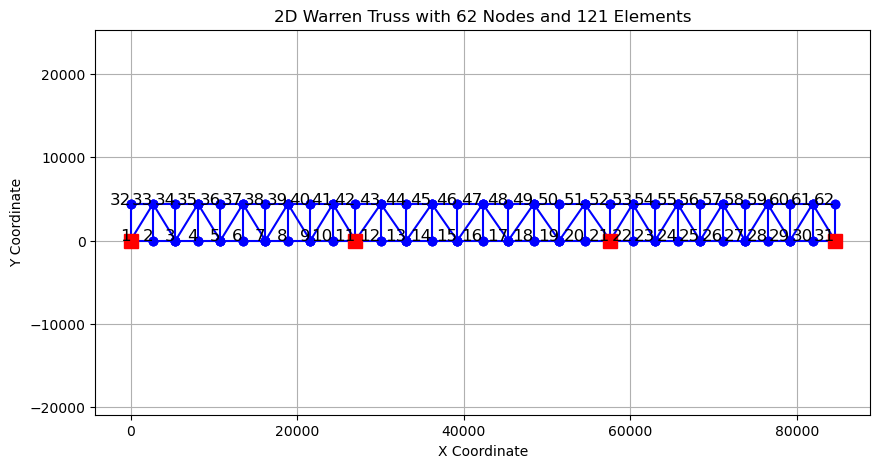

In [18]:
# Plot the truss
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))
for element in elements:
    node_start = nodes[element[1] - 1]
    node_end = nodes[element[2] - 1]
    plt.plot([node_start[1], node_end[1]], [node_start[2], node_end[2]], 'bo-')

# Annotate nodes
for node in nodes:
    plt.text(node[1], node[2], str(node[0]), fontsize=12, ha='right')
    
# Plot simply supports
simply_supported_nodes = [1,11, 21, 31]
for node_id in simply_supported_nodes:
    node = nodes[node_id - 1]
    plt.plot(node[1], node[2], 'rs', markersize=10)  # 'rs' for red square    

plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('2D Warren Truss with 62 Nodes and 121 Elements')
plt.grid(True)
plt.axis('equal')
plt.show()

In [19]:
### -----------------------------------------------------------
###   Bridge Substructure Ductility Damage Index Optimization
### -----------------------------------------------------------

# TRUSS SECTION PROPERTIES:
# define section geometry
B_01_MIN = 300 # [mm] MINIMUM SECTION 01 WIDTH
B_01_MAX = 400  # [mm] MAXIMUM SECTION 01 WIDTH
t_01_MIN = 8 # [mm] MINIMUM SECTION 01 THICKNESS
t_01_MAX = 20  # [mm] MAXIMUM SECTION 01 THICKNESS

B_02 = 200 # [mm] SECTION 02 WIDTH
t_02 = 10 # [mm] SECTION 02 THICKNESS
# -------------------------
Fy = 380.2			# [N/mm^2] Steel plate yield stress - ST52
Fu = 490.3			# [N/mm^2] Steel plate ultimate stress - ST52
# -------------------------
DMAX = 70 # [mm] Max. Pushover Incremental Displacement
ND01 = 16  # NODE NUMBER FOR INCREMENTAL DISPLACEMENT
ND02 = 47  # NODE NUMBER FOR INCREMENTAL DISPLACEMENT

Massef = 80 # TOTAL MASS OF STRUCTURES
g =  9810 # mm/s^2

TARGET_DI = 0.05 # [N] Target Demand Ductility Damage Index
## NEGETIVE DEMAND DUCTILITY DAMAGE INDEX, MEANS YOU LOOK FOR DEMAND DUCTILITY SAFETY INDEX

st = 20 # Sleep Time 

PCol = Massef / 62 # Mass of each Node (Truss has 62 Nodes)
PColw = PCol * g # Weight of each Node

DATA_FILE00 =f'C:\\OPENSEESPY_SALAR\\{FOLDER_NAME}\\T.txt' #STRUCTURE DATA


t = time.localtime()
current_time = time.strftime("%H:%M:%S", t)
print(f"Current time (HH:MM:SS): {current_time}\n\n")

NUM_ITERATION = 60
with open(DATA_FILE00, "w") as file:
    for i in range(NUM_ITERATION):
        I = (i/(NUM_ITERATION - 1))
        B_01 = B_01_MIN + (B_01_MAX - B_01_MIN) * I# Box 01 Width
        t_01 = t_01_MIN + (t_01_MAX - t_01_MIN) * I# Box 01 Thickness
        PUSHOVER_ANALYSIS(nodes, elements, B_01, t_01, B_02, t_02, Fy, Fu, PColw, ND01, ND02, DMAX, i)
        a = DYNAMIC_ANALYSIS(nodes, elements, B_01, t_01, B_02, t_02, Fy, Fu, PCol, PColw, ND01, i)
        time.sleep(st);# Sleep time
        dispD = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'DTH_DYN', 2, i, 2) # Reading Disp from Text file - DYNAMIC - NODE 16
        dispP = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'DTH_PUSH', 2, i, 2) # Reading Disp from Text file - PUSHOVER
        base01 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_PUSH_01', 2, i, 2) # Reading base shear from Text file - PUSHOVER - NODE 1
        base02 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_PUSH_11', 2, i, 2) # Reading base shear from Text file - PUSHOVER - NODE 11
        base03 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_PUSH_21', 2, i, 2) # Reading base shear from Text file - PUSHOVER - NODE 21
        base04 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_PUSH_31', 2, i, 2) # Reading base shear from Text file - PUSHOVER - NODE 21
        dispP = abs(dispP)
        baseP = abs(base01 + base02 + base03 + base04)
        xx, yy, Elastic_ST, Plastic_ST, Tangent_ST, Ductility_Rito, Over_Strength_Factor = BILNEAR_CURVE(dispP, baseP, 30)
        demand_disp = np.max(np.abs(dispD))# DISPLACEMENT 16 - DYNAMIC
        DI = (demand_disp - xx[1]) / (xx[2] - xx[1]) # STRUCTURE DUCTIITY DAMGE INDEX
        file.write(f"{i+1} {B_01:.6f} {t_01:.6f} {DI:.6f} {a:.6f}\n")
        print(f' {i+1} B01 {B_01} t01 {t_01} DI {DI}  T {a}')
    
    
t = time.localtime()
current_time = time.strftime("%H:%M:%S", t)
print(f"Current time (HH:MM:SS): {current_time}\n\n")

Current time (HH:MM:SS): 20:29:55


Model Built
1 Pushover Done.
Model Built


WARNING - the 'fullGenLapack' eigen solver is VERY SLOW. Consider using the default eigen solver.WARNING: CTestRelativeNormUnbalance::test() - failed to converge 
after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
1 Dynamic Done.
 1 B01 300.0 t01 8.0 DI 1.0000023549910708  T 0.4562097128614682
Model Built
2 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
2 Dynamic Done.
 2 B01 301.6949152542373 t01 8.203389830508474 DI 1.000002544204421  T 0.4519851298462722
Model Built
3 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
3 Dynamic Done.
 3 B01 303.3898305084746 t01 8.40677966101695 DI 1.000002749054653  T 0.44793765338607633
Model Built
4 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
4 Dynamic Done.
 4 B01 305.08474576271186 t01 8.610169491525424 DI 1.0000019809565537  T 0.4440563958574428
Model Built
5 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
5 Dynamic Done.
 5 B01 306.77966101694915 t01 8.813559322033898 DI 1.0000032136379795  T 0.44033140021945094
Model Built
6 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
6 Dynamic Done.
 6 B01 308.47457627118644 t01 9.016949152542374 DI 1.0000023189060638  T 0.4367535264044725
Model Built
7 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
7 Dynamic Done.
 7 B01 310.1694915254237 t01 9.220338983050848 DI 1.0000037689352885  T 0.4333143599437297
Model Built
8 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
8 Dynamic Done.
 8 B01 311.864406779661 t01 9.423728813559322 DI 1.0000040894391  T 0.43000613583371317
Model Built
9 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
9 Dynamic Done.
 9 B01 313.5593220338983 t01 9.627118644067796 DI 1.0000044452110923  T 0.42682167357221984
Model Built
10 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
10 Dynamic Done.
 10 B01 315.2542372881356 t01 9.830508474576272 DI 1.0000048430848483  T 0.42375432083743764
Model Built
11 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
11 Dynamic Done.
 11 B01 316.9491525423729 t01 10.033898305084746 DI 1.0000052922944163  T 0.42079790413175194
Model Built
12 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
12 Dynamic Done.
 12 B01 318.64406779661016 t01 10.237288135593221 DI 1.0000058060081967  T 0.4179466852034998
Model Built
13 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
13 Dynamic Done.
 13 B01 320.33898305084745 t01 10.440677966101696 DI 1.0000064040661303  T 0.41519532235883877
Model Built
14 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
14 Dynamic Done.
 14 B01 322.03389830508473 t01 10.64406779661017 DI 1.0000071194511368  T 0.4125388359708308
Model Built
15 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
15 Dynamic Done.
 15 B01 323.728813559322 t01 10.847457627118644 DI 0.9845711465346034  T 0.409972577625496
Model Built
16 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
16 Dynamic Done.
 16 B01 325.4237288135593 t01 11.050847457627118 DI 0.9605685123679311  T 0.40749220244285916
Model Built
17 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
17 Dynamic Done.
 17 B01 327.1186440677966 t01 11.254237288135593 DI 0.9226615324068224  T 0.40509364418348665
Model Built
18 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
18 Dynamic Done.
 18 B01 328.8135593220339 t01 11.457627118644067 DI 0.13415089485835205  T 0.4027730928095557
Model Built
19 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
19 Dynamic Done.
 19 B01 330.50847457627117 t01 11.661016949152543 DI 0.051833124104359835  T 0.40052697421633626
Model Built
20 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
20 Dynamic Done.
 20 B01 332.20338983050846 t01 11.864406779661017 DI 0.03195537967292761  T 0.39835193188827767
Model Built
21 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
21 Dynamic Done.
 21 B01 333.89830508474574 t01 12.067796610169491 DI 0.023119381146391324  T 0.3962448102662805
Model Built
22 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
22 Dynamic Done.
 22 B01 335.59322033898303 t01 12.271186440677965 DI 0.018137919819117696  T 0.3942026396403469
Model Built
23 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
23 Dynamic Done.
 23 B01 337.2881355932203 t01 12.474576271186441 DI 0.014944335403035745  T 0.3922226224042917
Model Built
24 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
24 Dynamic Done.
 24 B01 338.9830508474576 t01 12.677966101694915 DI 0.012723771707969431  T 0.39030212052981966
Model Built
25 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
25 Dynamic Done.
 25 B01 340.6779661016949 t01 12.881355932203391 DI 0.011090918720056492  T 0.3884386441340169
Model Built
26 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
26 Dynamic Done.
 26 B01 342.3728813559322 t01 13.084745762711865 DI 0.009840261317753235  T 0.3866298410292623
Model Built
27 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
27 Dynamic Done.
 27 B01 344.06779661016947 t01 13.288135593220339 DI 0.00885179947532918  T 0.38487348715717795
Model Built
28 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
28 Dynamic Done.
 28 B01 345.7627118644068 t01 13.491525423728813 DI 0.00805132239486996  T 0.3831674778200449
Model Built
29 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
29 Dynamic Done.
 29 B01 347.45762711864404 t01 13.694915254237287 DI 0.007389816396034022  T 0.3815098196317687
Model Built
30 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
30 Dynamic Done.
 30 B01 349.1525423728814 t01 13.898305084745763 DI 0.006834163726592204  T 0.37989862312032086
Model Built
31 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
31 Dynamic Done.
 31 B01 350.8474576271186 t01 14.101694915254237 DI 0.006360940555719883  T 0.3783320959199214
Model Built
32 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
32 Dynamic Done.
 32 B01 352.54237288135596 t01 14.305084745762713 DI 0.005953150550930378  T 0.37680853649845936
Model Built
33 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
33 Dynamic Done.
 33 B01 354.2372881355932 t01 14.508474576271187 DI 0.0055982201827695895  T 0.375326328371189
Model Built
34 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
34 Dynamic Done.
 34 B01 355.93220338983053 t01 14.711864406779661 DI 0.005286440306658165  T 0.3738839347568643
Model Built
35 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
35 Dynamic Done.
 35 B01 357.6271186440678 t01 14.915254237288135 DI 0.005010491514648253  T 0.3724798936369451
Model Built
36 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
36 Dynamic Done.
 36 B01 359.3220338983051 t01 15.118644067796609 DI 0.004764532050477467  T 0.3711128131826
Model Built
37 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
37 Dynamic Done.
 37 B01 361.0169491525424 t01 15.322033898305085 DI 0.004543981177324479  T 0.36978136751764107
Model Built
38 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
38 Dynamic Done.
 38 B01 362.7118644067797 t01 15.525423728813559 DI 0.004345178461109615  T 0.36848429278858535
Model Built
39 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
39 Dynamic Done.
 39 B01 364.4067796610169 t01 15.728813559322033 DI 0.0041650276795518176  T 0.3672203835162804
Model Built
40 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
40 Dynamic Done.
 40 B01 366.10169491525426 t01 15.932203389830509 DI 0.004001015314175286  T 0.36598848920527105
Model Built
41 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
41 Dynamic Done.
 41 B01 367.7966101694915 t01 16.135593220338983 DI 0.0038511013860076243  T 0.3647875111900325
Model Built
42 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
42 Dynamic Done.
 42 B01 369.49152542372883 t01 16.33898305084746 DI 0.0037136149060441313  T 0.3636163996987766
Model Built
43 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
43 Dynamic Done.
 43 B01 371.1864406779661 t01 16.54237288135593 DI 0.003587020812710485  T 0.3624741511172275
Model Built
44 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
44 Dynamic Done.
 44 B01 372.8813559322034 t01 16.74576271186441 DI 0.0034700731838889797  T 0.3613598054368974
Model Built
45 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
45 Dynamic Done.
 45 B01 374.5762711864407 t01 16.949152542372882 DI 0.0033618009461005333  T 0.360272443873014
Model Built
46 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
46 Dynamic Done.
 46 B01 376.271186440678 t01 17.152542372881356 DI 0.003261241613268927  T 0.3592111866393451
Model Built
47 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
47 Dynamic Done.
 47 B01 377.96610169491527 t01 17.35593220338983 DI 0.0031675788938803234  T 0.35817519086769084
Model Built
48 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
48 Dynamic Done.
 48 B01 379.66101694915255 t01 17.559322033898304 DI 0.0030801964535235263  T 0.35716364866126143
Model Built
49 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
49 Dynamic Done.
 49 B01 381.35593220338984 t01 17.762711864406782 DI 0.0029984328015835193  T 0.3561757852718805
Model Built
50 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
50 Dynamic Done.
 50 B01 383.0508474576271 t01 17.966101694915253 DI 0.0029218118463952506  T 0.35521085739185404
Model Built
51 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
51 Dynamic Done.
 51 B01 384.7457627118644 t01 18.16949152542373 DI 0.0028498418875772297  T 0.35426815155221447
Model Built
52 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
52 Dynamic Done.
 52 B01 386.4406779661017 t01 18.372881355932204 DI 0.0027821138032495395  T 0.3533469826195544
Model Built
53 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
53 Dynamic Done.
 53 B01 388.135593220339 t01 18.576271186440678 DI 0.0027183125955369545  T 0.3524466923844668
Model Built
54 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
54 Dynamic Done.
 54 B01 389.8305084745763 t01 18.779661016949152 DI 0.0026580492219353408  T 0.35156664823510175
Model Built
55 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
55 Dynamic Done.
 55 B01 391.52542372881356 t01 18.983050847457626 DI 0.002601090415984662  T 0.35070624190984184
Model Built
56 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
56 Dynamic Done.
 56 B01 393.22033898305085 t01 19.1864406779661 DI 0.00254714678803104  T 0.3498648883237219
Model Built
57 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
57 Dynamic Done.
 57 B01 394.91525423728814 t01 19.389830508474574 DI 0.002496019520459562  T 0.3490420244633237
Model Built
58 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
58 Dynamic Done.
 58 B01 396.6101694915254 t01 19.593220338983052 DI 0.0024474425196399437  T 0.3482371083457299
Model Built
59 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
59 Dynamic Done.
 59 B01 398.3050847457627 t01 19.796610169491526 DI 0.002401289675105002  T 0.34744961803712987
Model Built
60 Pushover Done.
Model Built


after: 1000 iterations
AcceleratedNewton::solveCurrentStep() -The ConvergenceTest object failed in test()
DirectIntegrationAnalysis::analyze() - the Algorithm failed at time 0.01
OpenSees > analyze failed, returned: -3 error flag


NormDispIncr KrylovNewton 0
60 Dynamic Done.
 60 B01 400.0 t01 20.0 DI 0.002357349918871051  T 0.34667905072702476
Current time (HH:MM:SS): 08:52:12




In [10]:
## FILE ADDRESS
DATA_FILE01 =f'C:\\OPENSEESPY_SALAR\\{FOLDER_NAME}\\MD'  # DISPLACEMENT TIME HISTORY
DATA_FILE02 =f'C:\\OPENSEESPY_SALAR\\{FOLDER_NAME}\\MV'  # VELOCITY TIME HISTORY
DATA_FILE03 =f'C:\\OPENSEESPY_SALAR\\{FOLDER_NAME}\\MA'  # ACCELERATION TIME HISTORY

DATA_FILE04 =f'C:\\OPENSEESPY_SALAR\\{FOLDER_NAME}\\PUSH_nodeDisplacements'  # NODE DISPLACEMENT - PUSH
DATA_FILE05 =f'C:\\OPENSEESPY_SALAR\\{FOLDER_NAME}\\PUSH_elementForces'  # ELEMENT FORCE - PUSH
DATA_FILE06 =f'C:\\OPENSEESPY_SALAR\\{FOLDER_NAME}\\PUSH_fiber_StressStrain'  # SECTION STRAIN-STRESS - PUSH

DATA_FILE07 =f'C:\\OPENSEESPY_SALAR\\{FOLDER_NAME}\\DYN_nodeDisplacements'  # NODE DISPLACEMENT - DYN
DATA_FILE08 =f'C:\\OPENSEESPY_SALAR\\{FOLDER_NAME}\\DYN_elementForces'  # ELEMENT FORCE - DYN
DATA_FILE09 =f'C:\\OPENSEESPY_SALAR\\{FOLDER_NAME}\\DYN_fiber_StressStrain'  # SECTION STRAIN-STRESS - DYN

In [14]:
#B_02 = 200 # [mm] SECTION 02 WIDTH
#t_02 = 10 # [mm] SECTION 02 THICKNESS
Fy = 380.2			# [N/mm^2] - STEEL TRUSS ELEMENT - ST52
Fu = 490.3			# [N/mm^2] - STEEL TRUSS ELEMENT - ST52

ey = Fy/200000 # Yield strain - STEEL TRUSS ELEMENT - ST52
eu = 0.9  # Ultimate strain - STEEL TRUSS ELEMENT - ST52

SECTION_AREA_01 = B_01**2 - (B_01 - t_01)**2
SECTION_AREA_02 = B_02**2 - (B_02 - t_02)**2
# YIELD STRENGTH
YIELD_STRENGTH_01 = SECTION_AREA_01 * Fy
YIELD_STRENGTH_02 = SECTION_AREA_02 * Fy
# ULTIMATE STRENGTH
ULTIMATE_STRENGTH_01 = SECTION_AREA_01 * Fu
ULTIMATE_STRENGTH_02 = SECTION_AREA_02 * Fu

print('YIELD STRENGTH 01: ', YIELD_STRENGTH_01)
print('YIELD STRENGTH 02: ', YIELD_STRENGTH_02)
print('ULTIMATE STRENGTH 01: ', ULTIMATE_STRENGTH_01)
print('ULTIMATE STRENGTH 02: ', ULTIMATE_STRENGTH_02)

YIELD STRENGTH 01:  [1800627.2        1856344.17551001 1912553.96507258 1969256.33061803
 2026451.72812864 2084139.93329927 2142320.95314108 2200994.77378642
 2260161.40209179 2319820.605813   2379972.85593405 2440617.90624
 2501755.764206   2563386.42983202 2625509.91136648 2688125.95341807
 2751235.04104468 2814836.93633132 2878931.64814502 2943519.15890638
 3008599.47732775 3074172.35755508 3140238.29964804 3206797.04007001
 3273848.588152   3341392.94389403 3409430.11740038 3477959.83595812
 3546982.61370072 3616498.19910336 3686506.60288897 3757007.80376633
 3828001.81230371 3899488.36903718 3971468.00310203 4043940.43364001
 4116905.671838   4190363.71769603 4264314.58317429 4338757.97823816
 4413694.44609676 4489123.72161542 4565045.81737291 4641460.70836628
 4718368.40701967 4795768.64025928 4873661.96629601 4952048.08695
 5030927.01526402 5110298.75123804 5190163.3086882  5270520.3802582
 5351370.53823282 5432713.50386747 5514549.29159687 5596877.87270624
 5679699.26147565 576

In [39]:
### LOAD OUTPUT DATAS

import numpy as np
filename = f'C:\\OPENSEESPY_SALAR\\{FOLDER_NAME}\\T.txt'
data = np.loadtxt(filename)
B_01 = data[:, 1] # Section Box 1 Width
t_01 = data[:, 2]# Section Box 1 Thickness
T = data[:, 4]

pgd = [] # Peak Displacement 
pgv = [] # Peak Velocity
pga = [] # Peak Acceleration
pgb = [] # Base shear during dynamic
period = []
nf = [] # natural frequency
axialL = [] # Applied Axial Load [DEMAND]
AXIALr = [] # Resistance Axial Load [CAPACITY]

Push_Disp37 = [] # Vertical Displacement Node 37 - PUSH
Push_Disp47 = [] # Vertical Displacement Node 47 - PUSH
Push_Disp57 = [] # Vertical Displacement Node 57 - PUSH

Push_eleForce06 = [] # Element Axial Load 06 - PUSH
Push_eleStrain06 = [] # Element Axial Strain 06 - PUSH
Push_eleStress06 = [] # Element Axial Stress 06 - PUSH

Push_eleForce16 = [] # Element Axial Load 16 - PUSH
Push_eleStrain16 = [] # Element Axial Strain 16 - PUSH
Push_eleStress16 = [] # Element Axial Stress 16 - PUSH

Push_eleForce26 = [] # Element Axial Load 26 - PUSH
Push_eleStrain26 = [] # Element Axial Strain 26 - PUSH
Push_eleStress26 = [] # Element Axial Stress 26 - PUSH

Push_eleForce70 = [] # Element Axial Load 70 - PUSH
Push_eleStrain70 = [] # Element Axial Strain 70 - PUSH
Push_eleStress70 = [] # Element Axial Stress 70 - PUSH

Push_eleForce90 = [] # Element Axial Load 90 - PUSH
Push_eleStrain90 = [] # Element Axial Strain 90 - PUSH
Push_eleStress90 = [] # Element Axial Stress 90 - PUSH

Push_eleForce110 = [] # Element Axial Load 110 - PUSH
Push_eleStrain110 = [] # Element Axial Strain 110 - PUSH
Push_eleStress110 = [] # Element Axial Stress 110 - PUSH

Dyn_Disp37 = [] # Vertical Displacement Node 37 - DYN
Dyn_Disp47 = [] # Vertical Displacement Node 47 - DYN
Dyn_Disp57 = [] # Vertical Displacement Node 57 - DYN

Dyn_eleForce06 = [] # Element Axial Load 06 - DYN
Dyn_eleStrain06 = [] # Element Axial Strain 06 - DYN
Dyn_eleStress06 = [] # Element Axial Stress 06 - DYN

Dyn_eleForce16 = [] # Element Axial Load 16 - DYN
Dyn_eleStrain16 = [] # Element Axial Strain 16 - DYN
Dyn_eleStress16 = [] # Element Axial Stress 16 - DYN

Dyn_eleForce26 = [] # Element Axial Load 26 - DYN
Dyn_eleStrain26 = [] # Element Axial Strain 26 - DYN
Dyn_eleStress26 = [] # Element Axial Stress 26 - DYN

Dyn_eleForce70 = [] # Element Axial Load 70 - DYN
Dyn_eleStrain70 = [] # Element Axial Strain 70 - DYN
Dyn_eleStress70 = [] # Element Axial Stress 70 - DYN

Dyn_eleForce90 = [] # Element Axial Load 90 - DYN
Dyn_eleStrain90 = [] # Element Axial Strain 90 - DYN
Dyn_eleStress90 = [] # Element Axial Stress 90 - DYN

Dyn_eleForce110 = [] # Element Axial Load 110 - DYN
Dyn_eleStrain110 = [] # Element Axial Strain 110 - DYN
Dyn_eleStress110 = [] # Element Axial Stress 110 - DYN

diS = [] # Structure Ductility Damage Index

diA06 = [] # Truss Axial Ductility Damage Index Element 06
diA16 = [] # Truss Axial Ductility Damage Index Element 16
diA26 = [] # Truss Axial Ductility Damage Index Element 26
diA70 = [] # Truss Axial Ductility Damage Index Element 70
diA90 = [] # Truss Axial Ductility Damage Index Element 90
diA110 = [] # Truss Axial Ductility Damage Index Element 110

diAS06 = [] # Truss Axial Strength Damage Index Element 06
diAS16 = [] # Truss Axial Strength Damage Index Element 16
diAS26 = [] # Truss Axial Strength Damage Index Element 26
diAS70 = [] # Truss Axial Strength Damage Index Element 70
diAS90 = [] # Truss Axial Strength Damage Index Element 90
diAS110 = [] # Truss Axial Strength Damage Index Element 110

bDbP = [] # Ratio Base-shear Dynamic to Base-shear Pushover
dDdP = [] # Ratio Displacement Dynamic to Displacement Pushover



NUM_ITERATION = 60

for i in range(NUM_ITERATION):
    period.append(T[i])
    nf.append(1/T[i])
    pgd.append(MAXABS_FUN(DATA_FILE01, 1, i, _, 1))# MAX ABS DISPLACEMENT OF NODE 16
    pgv.append(MAXABS_FUN(DATA_FILE02, 1, i, _, 1))# MAX ABS VELOCITY OF NODE 16
    pga.append(MAXABS_FUN(DATA_FILE03, 1, i, _, 1))# MAX ABS ACCELERATION OF NODE 16
    dispD = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'DTH_DYN', 2, i, 2) # Reading Disp from Text file - DYNAMIC - NODE 16
    base01 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_DYN_01', 2, i, 2) # Reading base shear from Text file - DYNAMIC - NODE 1
    base02 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_DYN_11', 2, i, 2) # Reading base shear from Text file - DYNAMIC - NODE 11
    base03 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_DYN_21', 2, i, 2) # Reading base shear from Text file - DYNAMIC - NODE 21
    base04 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_DYN_31', 2, i, 2) # Reading base shear from Text file - DYNAMIC - NODE 31
    baseD = max(abs(base01 + base02 + base03 + base04))
    pgb.append(baseD)
    # STRUCTURE DUCTILITY DAMAGE INDEX
    dispP = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'DTH_PUSH', 2, i, 2) # Reading Disp from Text file - PUSHOVER
    base01 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_PUSH_01', 2, i, 2) # Reading base shear from Text file - PUSHOVER - NODE 1
    base02 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_PUSH_11', 2, i, 2) # Reading base shear from Text file - PUSHOVER - NODE 11
    base03 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_PUSH_21', 2, i, 2) # Reading base shear from Text file - PUSHOVER - NODE 21
    base04 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_PUSH_31', 2, i, 2) # Reading base shear from Text file - PUSHOVER - NODE 21
    dispP = abs(dispP)
    baseP = abs(base01 + base02 + base03 + base04)
    bDbP.append(pgb[-1] / max(baseP))
    dDdP.append(pgd[-1] / max(dispP))
    xx, yy, _, _, _, _, _ = BILNEAR_CURVE(dispP, baseP, 30)
    demand_disp = np.max(np.abs(dispD)) # DISPLACEMENT DYNAMIC ANALYSIS NODE 16
    DIs = (demand_disp - xx[1]) / (xx[2] - xx[1])
    diS.append(DIs)
    # AXIAL DUCTILITY DAMAGE INDEX
    # DEMAND STRAIN
    Dyn_eleStrain06.append(MAXABS_FUN(DATA_FILE09, 2, i, 5, 2))# ELEMENT 6 STRAIN
    Dyn_eleStrain16.append(MAXABS_FUN(DATA_FILE09, 2, i, 15, 2))# ELEMENT 16 STRAIN
    Dyn_eleStrain26.append(MAXABS_FUN(DATA_FILE09, 2, i, 25, 2))# ELEMENT 26 STRAIN
    Dyn_eleStrain70.append(MAXABS_FUN(DATA_FILE09, 2, i, 69, 2))# ELEMENT 70 STRAIN
    Dyn_eleStrain90.append(MAXABS_FUN(DATA_FILE09, 2, i, 89, 2))# ELEMENT 90 STRAIN
    Dyn_eleStrain110.append(MAXABS_FUN(DATA_FILE09, 2, i, 109, 2))# ELEMENT 110 STRAIN
    DI_AXIAL_06 = (Dyn_eleStrain06[-1] - ey) / (eu - ey)# Axial Ductility Damage Index for element 06
    DI_AXIAL_16 = (Dyn_eleStrain16[-1] - ey) / (eu - ey)# Axial Ductility Damage Index for element 16
    DI_AXIAL_26 = (Dyn_eleStrain26[-1] - ey) / (eu - ey)# Axial Ductility Damage Index for element 26
    DI_AXIAL_70 = (Dyn_eleStrain70[-1] - ey) / (eu - ey)# Axial Ductility Damage Index for element 70
    DI_AXIAL_90 = (Dyn_eleStrain90[-1] - ey) / (eu - ey)# Axial Ductility Damage Index for element 90
    DI_AXIAL_110 = (Dyn_eleStrain110[-1] - ey) / (eu - ey)# Axial Ductility Damage Index for element 110
    diA06.append(DI_AXIAL_06)
    diA16.append(DI_AXIAL_16)
    diA26.append(DI_AXIAL_26)
    diA70.append(DI_AXIAL_70)
    diA90.append(DI_AXIAL_90)
    diA110.append(DI_AXIAL_110)
    
    # AXIAL FORCE AND STRESS 
    Push_eleForce06.append(MAXABS_FUN(DATA_FILE05, 1, i, 5, 2))# ELEMENT 6 FORCE
    Push_eleStress06.append(MAXABS_FUN(DATA_FILE06, 1, i, 5, 2))# ELEMENT 6 STRESS
        
    Push_eleForce16.append(MAXABS_FUN(DATA_FILE05, 1, i, 15, 2))# ELEMENT 16 FORCE
    Push_eleStress16.append(MAXABS_FUN(DATA_FILE06, 1, i, 15, 2))# ELEMENT 16 STRESS
        
    Push_eleForce26.append(MAXABS_FUN(DATA_FILE05, 1, i, 25, 2))# ELEMENT 26 FORCE
    Push_eleStress26.append(MAXABS_FUN(DATA_FILE06, 1, i, 25, 2))# ELEMENT 26 STRESS
        
    Push_eleForce70.append(MAXABS_FUN(DATA_FILE05, 1, i, 69, 2))# ELEMENT 70 FORCE
    Push_eleStress70.append(MAXABS_FUN(DATA_FILE06, 1, i, 69, 2))# ELEMENT 70 STRESS
        
    Push_eleForce90.append(MAXABS_FUN(DATA_FILE05, 1, i, 89, 2))# ELEMENT 90 FORCE
    Push_eleStress90.append(MAXABS_FUN(DATA_FILE06, 1, i, 89, 2))# ELEMENT 90 STRESS
        
    Push_eleForce110.append(MAXABS_FUN(DATA_FILE05, 1, i, 109, 2))# ELEMENT 110 FORCE
    Push_eleStress110.append(MAXABS_FUN(DATA_FILE06, 1, i, 109, 2))# ELEMENT 110 STRESS
    # ---------------------------------------------
    Dyn_eleForce06.append(MAXABS_FUN(DATA_FILE08, 1, i, 5, 2))# ELEMENT 6 FORCE
    Dyn_eleStress06.append(MAXABS_FUN(DATA_FILE09, 1, i, 5, 2))# ELEMENT 6 STRESS
        
    Dyn_eleForce16.append(MAXABS_FUN(DATA_FILE08, 1, i, 15, 2))# ELEMENT 16 FORCE
    Dyn_eleStress16.append(MAXABS_FUN(DATA_FILE09, 1, i, 15, 2))# ELEMENT 16 STRESS
        
    Dyn_eleForce26.append(MAXABS_FUN(DATA_FILE08, 1, i, 25, 2))# ELEMENT 26 FORCE
    Dyn_eleStress26.append(MAXABS_FUN(DATA_FILE09, 1, i, 25, 2))# ELEMENT 26 STRESS
        
    Dyn_eleForce70.append(MAXABS_FUN(DATA_FILE08, 1, i, 69, 2))# ELEMENT 70 FORCE
    Dyn_eleStress70.append(MAXABS_FUN(DATA_FILE09, 1, i, 69, 2))# ELEMENT 70 STRESS
        
    Dyn_eleForce90.append(MAXABS_FUN(DATA_FILE08, 1, i, 89, 2))# ELEMENT 90 FORCE
    Dyn_eleStress90.append(MAXABS_FUN(DATA_FILE09, 1, i, 89, 2))# ELEMENT 90 STRESS
        
    Dyn_eleForce110.append(MAXABS_FUN(DATA_FILE08, 1, i, 109, 2))# ELEMENT 110 FORCE
    Dyn_eleStress110.append(MAXABS_FUN(DATA_FILE09, 1, i, 109, 2))# ELEMENT 110 STRESS
    # STRENGTH DAMAGE INDEX
    # Different Strength so Different Strength Damage Index
    DIs_AXIAL_06 = STRENGTH_DAMAGE_INDEX(Dyn_eleForce06[-1], YIELD_STRENGTH_01[i], ULTIMATE_STRENGTH_01[i])# Axial Strength Damage Index for element 06
    DIs_AXIAL_16 = STRENGTH_DAMAGE_INDEX(Dyn_eleForce16[-1], YIELD_STRENGTH_01[i], ULTIMATE_STRENGTH_01[i])# Axial Strength Damage Index for element 16
    DIs_AXIAL_26 = STRENGTH_DAMAGE_INDEX(Dyn_eleForce26[-1], YIELD_STRENGTH_01[i], ULTIMATE_STRENGTH_01[i])# Axial Strength Damage Index for element 26
    DIs_AXIAL_70 = STRENGTH_DAMAGE_INDEX(Dyn_eleForce70[-1], YIELD_STRENGTH_02, ULTIMATE_STRENGTH_02)# Axial Strength Damage Index for element 70
    DIs_AXIAL_90 = STRENGTH_DAMAGE_INDEX(Dyn_eleForce90[-1], YIELD_STRENGTH_02, ULTIMATE_STRENGTH_02)# Axial Strength Damage Index for element 90
    DIs_AXIAL_110 = STRENGTH_DAMAGE_INDEX(Dyn_eleForce110[-1], YIELD_STRENGTH_02, ULTIMATE_STRENGTH_02)# Axial Strength Damage Index for element 110
    diAS06.append(DIs_AXIAL_06)
    diAS16.append(DIs_AXIAL_16)
    diAS26.append(DIs_AXIAL_26)
    diAS70.append(DIs_AXIAL_70)
    diAS90.append(DIs_AXIAL_90)
    diAS110.append(DIs_AXIAL_110)
    axialL.append(Dyn_eleForce16[-1])# Last data applied axial load of element 16 [DEMAND]
    AXIALr.append(ULTIMATE_STRENGTH_01)# Last data resistance axial load of element 16 [CAPACITY]
    print(f'{i+1} T: {period[-1]:.5e} nf: {nf[-1]:.5e} pgd: {pgd[-1]:.5e} pgv: {pgv[-1]:.5e} pga: {pga[-1]:.5e} pgb: {pgb[-1]:.5e}')


1 T: 4.56210e-01 nf: 2.19197e+00 pgd: 4.45799e+01 pgv: 5.92791e-03 pga: 1.30539e-01 pgb: 7.84803e+05
2 T: 4.51985e-01 nf: 2.21246e+00 pgd: 4.40765e+01 pgv: 5.84601e-03 pga: 1.29852e-01 pgb: 7.84803e+05
3 T: 4.47938e-01 nf: 2.23245e+00 pgd: 4.35982e+01 pgv: 5.83477e-03 pga: 1.30259e-01 pgb: 7.84804e+05
4 T: 4.44056e-01 nf: 2.25197e+00 pgd: 4.31430e+01 pgv: 5.87503e-03 pga: 1.31670e-01 pgb: 7.84804e+05
5 T: 4.40331e-01 nf: 2.27102e+00 pgd: 4.27095e+01 pgv: 5.94373e-03 pga: 1.33848e-01 pgb: 7.84804e+05
6 T: 4.36754e-01 nf: 2.28962e+00 pgd: 4.22961e+01 pgv: 6.01844e-03 pga: 1.36468e-01 pgb: 7.84804e+05
7 T: 4.33314e-01 nf: 2.30780e+00 pgd: 4.19016e+01 pgv: 6.08170e-03 pga: 1.39194e-01 pgb: 7.84804e+05
8 T: 4.30006e-01 nf: 2.32555e+00 pgd: 4.15245e+01 pgv: 6.22250e-03 pga: 1.41754e-01 pgb: 7.84804e+05
9 T: 4.26822e-01 nf: 2.34290e+00 pgd: 4.11639e+01 pgv: 6.64228e-03 pga: 1.43980e-01 pgb: 7.84805e+05
10 T: 4.23754e-01 nf: 2.35986e+00 pgd: 4.08187e+01 pgv: 7.02135e-03 pga: 1.47517e-01 pgb: 7

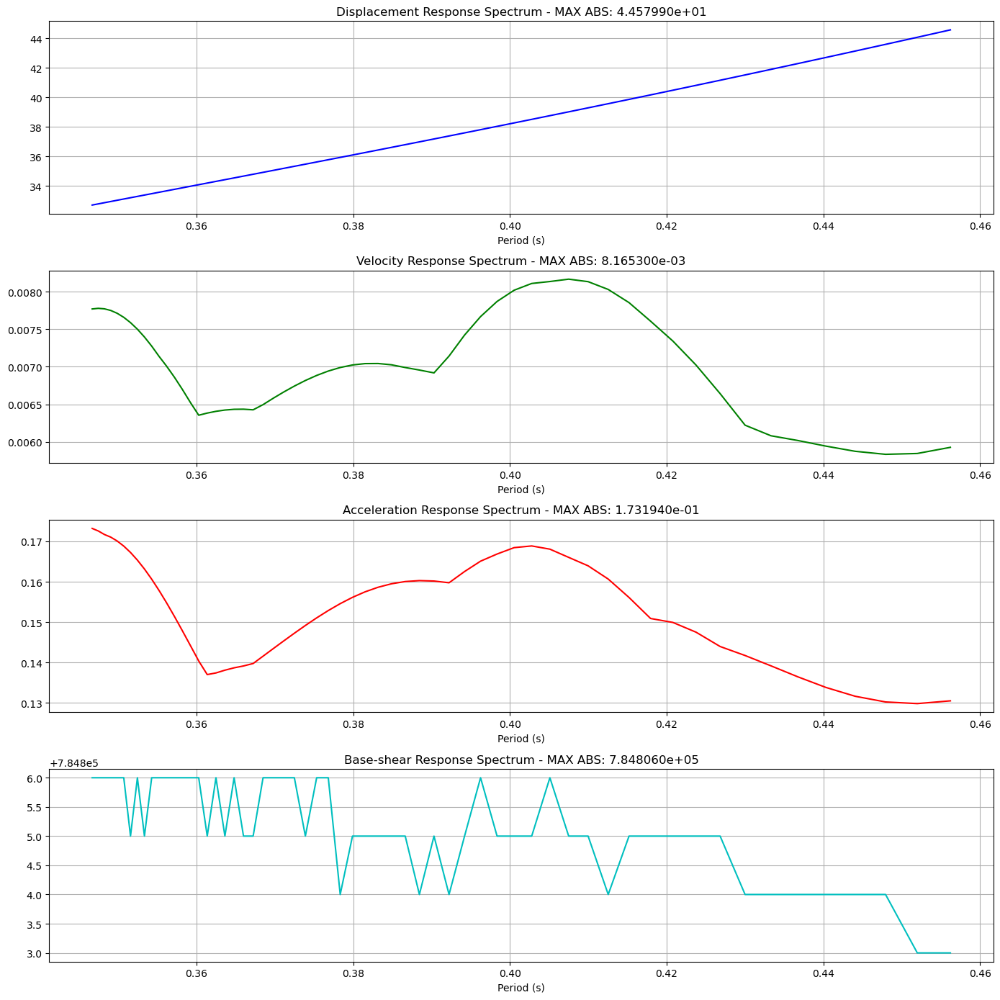

In [40]:
xlabel = 'Period (s)'
y1label = 'Displacement Response Spectrum'
y2label = 'Velocity Response Spectrum'
y3label = 'Acceleration Response Spectrum'
y4label = 'Base-shear Response Spectrum'
PLOT_TIME_HIS(period, xlabel, pgd, y1label, pgv, y2label, pga, y3label, pgb, y4label, Z=4, LOGX=0, LOGY=0)

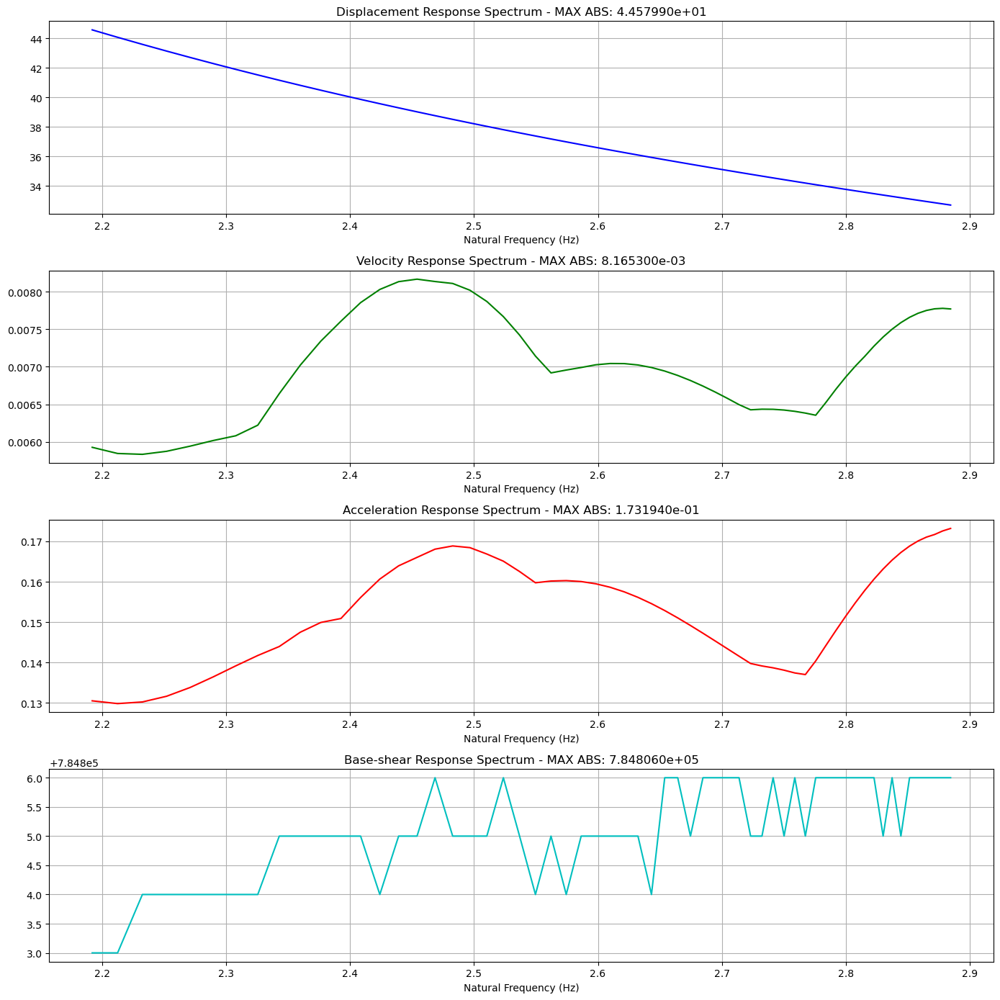

In [41]:
xlabel = 'Natural Frequency (Hz)'
y1label = 'Displacement Response Spectrum'
y2label = 'Velocity Response Spectrum'
y3label = 'Acceleration Response Spectrum'
y4label = 'Base-shear Response Spectrum'
PLOT_TIME_HIS(nf, xlabel, pgd, y1label, pgv, y2label, pga, y3label, pgb, y4label, Z=4, LOGX=0, LOGY=0)

In [50]:
XLABEL = 'Section Box 1 Width'
YLABEL = 'Section Box 1 Thickness'
ZLABEL = 'Period'
TITLE = '3D CHART'
PLOT3D(B_01, t_01, T, XLABEL, YLABEL, ZLABEL, TITLE)

In [51]:
XLABEL = 'Section Box 1 Width'
YLABEL = 'Section Box 1 Thickness'
ZLABEL = 'STRUCTURAL DUCTILITY DAMAGE INDEX'
TITLE = '3D CHART'
PLOT3D(B_01, t_01, diS, XLABEL, YLABEL, ZLABEL, TITLE)

In [55]:
XLABEL = 'Section Box 1 Width'
YLABEL = 'Section Box 1 Thickness'
ZLABEL = 'Axial Ductility Damage Index Element 26'
TITLE = '3D CHART'
PLOT3D(B_01, t_01, diA26, XLABEL, YLABEL, ZLABEL, TITLE)

In [54]:
XLABEL = 'Section Box 1 Width'
YLABEL = 'Section Box 1 Thickness'
ZLABEL = 'Axial Ductility Damage Index Element 70'
TITLE = '3D CHART'
PLOT3D(B_01, t_01, diA70, XLABEL, YLABEL, ZLABEL, TITLE)

In [61]:
XLABEL = 'Section Box 1 Width'
YLABEL = 'Section Box 1 Thickness'
ZLABEL = 'Axial Strength Damage Index Element 26'
TITLE = '3D CHART'
PLOT3D(B_01, t_01, diAS26, XLABEL, YLABEL, ZLABEL, TITLE)

In [62]:
XLABEL = 'Section Box 1 Width'
YLABEL = 'Section Box 1 Thickness'
ZLABEL = 'Axial Strength Damage Index Element 70'
TITLE = '3D CHART'
PLOT3D(B_01, t_01, diAS70, XLABEL, YLABEL, ZLABEL, TITLE)

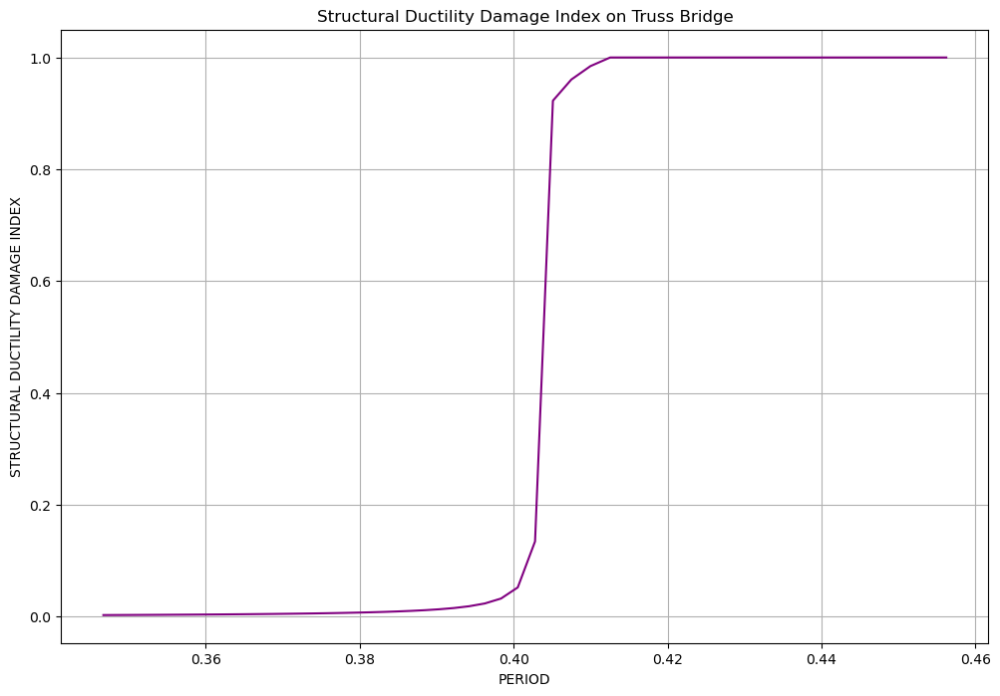

In [42]:
# Data usage
X = period
Y = diS
XLABEL = 'PERIOD'
YLABEL = 'STRUCTURAL DUCTILITY DAMAGE INDEX'
TITLE = 'Structural Ductility Damage Index on Truss Bridge'
LABELS = 'DI'
PLOT_2D(X, Y, _, _, XLABEL, YLABEL, TITLE, COLOR='purple', Z=1)

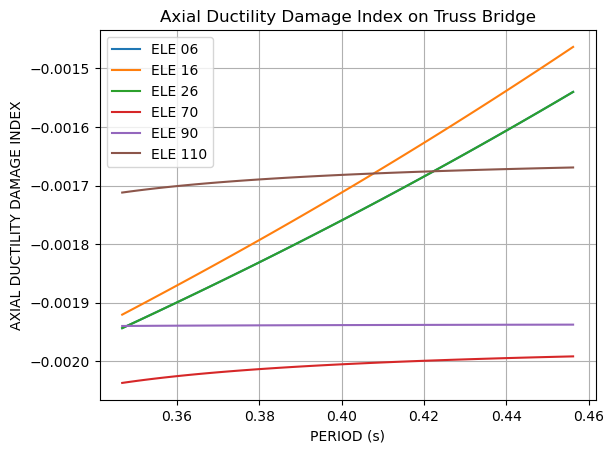

In [43]:
# Data usage
x = period
y_list = [
    diA06,
    diA16,
    diA26,
    diA70, 
    diA90,
    diA110
]

XLABEL = 'PERIOD (s)'
YLABEL = 'AXIAL DUCTILITY DAMAGE INDEX'
TITLE = 'Axial Ductility Damage Index on Truss Bridge'
LABELS = ['ELE 06', 'ELE 16','ELE 26', 'ELE 70', 'ELE 90', 'ELE 110']
plot_multiple_lines(x, y_list, LABELS, XLABEL, YLABEL, TITLE)


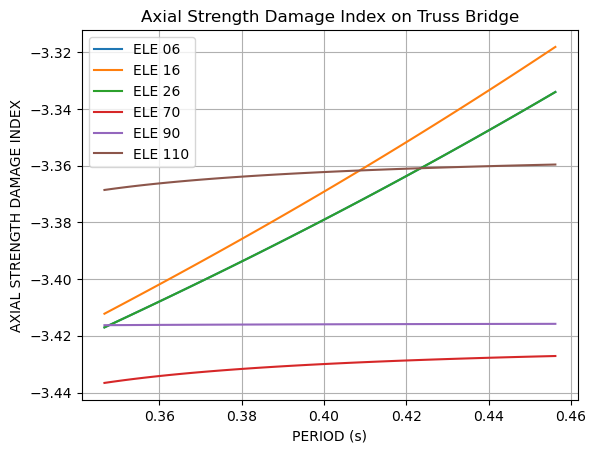

In [45]:
# Data usage
x = period
y_list = [
    diAS06,
    diAS16,
    diAS26,
    diAS70, 
    diAS90,
    diAS110
]

XLABEL = 'PERIOD (s)'
YLABEL = 'AXIAL STRENGTH DAMAGE INDEX'
TITLE = 'Axial Strength Damage Index on Truss Bridge'
LABELS = ['ELE 06', 'ELE 16','ELE 26', 'ELE 70', 'ELE 90', 'ELE 110']
plot_multiple_lines(x, y_list, LABELS, XLABEL, YLABEL, TITLE)

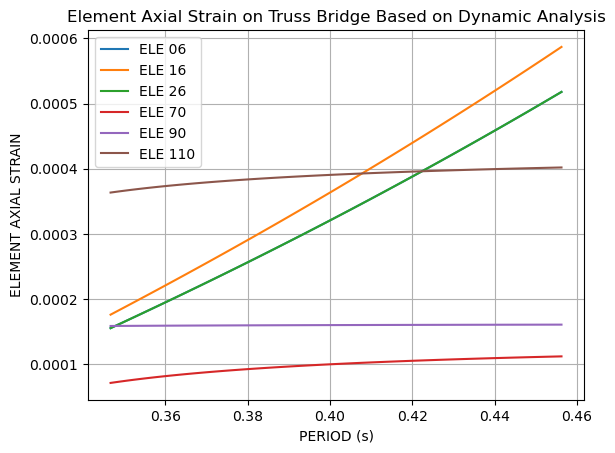

In [46]:
# Data usage
x = period
y_list = [
    Dyn_eleStrain06,
    Dyn_eleStrain16,
    Dyn_eleStrain26,
    Dyn_eleStrain70, 
    Dyn_eleStrain90,
    Dyn_eleStrain110
]

XLABEL = 'PERIOD (s)'
YLABEL = 'ELEMENT AXIAL STRAIN'
TITLE = 'Element Axial Strain on Truss Bridge Based on Dynamic Analysis'
LABELS = ['ELE 06', 'ELE 16','ELE 26', 'ELE 70', 'ELE 90', 'ELE 110']
plot_multiple_lines(x, y_list, LABELS, XLABEL, YLABEL, TITLE)


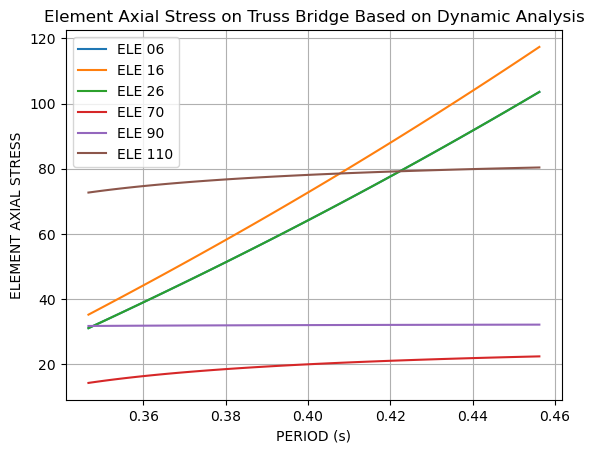

In [47]:
# Data usage
x = period
y_list = [
    Dyn_eleStress06,
    Dyn_eleStress16,
    Dyn_eleStress26,
    Dyn_eleStress70, 
    Dyn_eleStress90,
    Dyn_eleStress110
]

XLABEL = 'PERIOD (s)'
YLABEL = 'ELEMENT AXIAL STRESS'
TITLE = 'Element Axial Stress on Truss Bridge Based on Dynamic Analysis'
LABELS = ['ELE 06', 'ELE 16','ELE 26', 'ELE 70', 'ELE 90', 'ELE 110']
plot_multiple_lines(x, y_list, LABELS, XLABEL, YLABEL, TITLE)


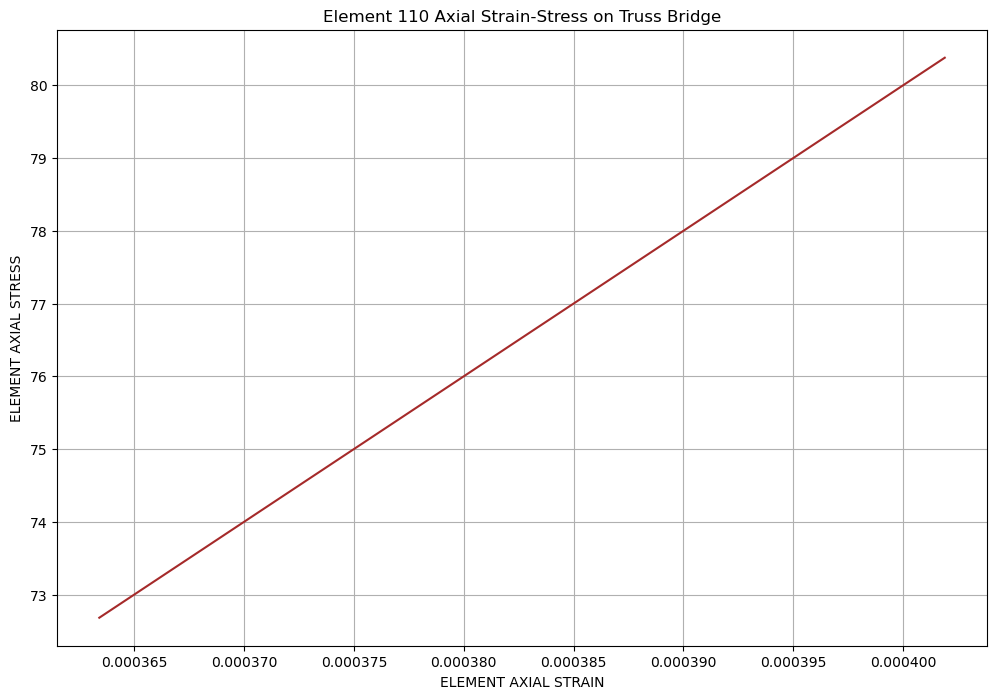

In [28]:
# Data usage
X = Dyn_eleStrain110
Y = Dyn_eleStress110
XLABEL = 'ELEMENT AXIAL STRAIN'
YLABEL = 'ELEMENT AXIAL STRESS'
TITLE = 'Element 110 Axial Strain-Stress on Truss Bridge'
LABELS = 'ELE 110'
PLOT_2D(X, Y, _, _, XLABEL, YLABEL, TITLE, COLOR='brown', Z=1)

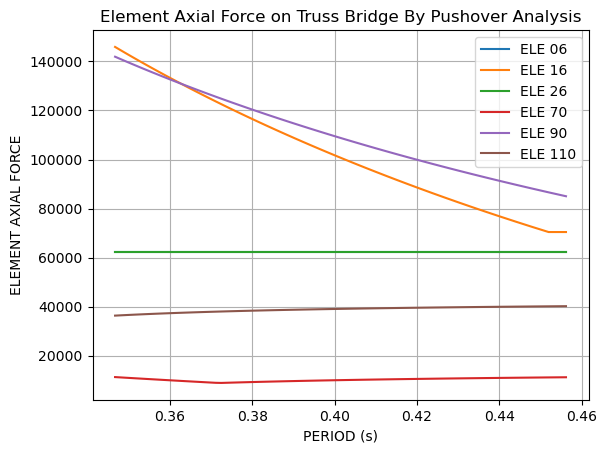

In [29]:
# Data usage
x = period
y_list = [
    Push_eleForce06,
    Push_eleForce16,
    Push_eleForce26,
    Push_eleForce70, 
    Push_eleForce90,
    Push_eleForce110
]

XLABEL = 'PERIOD (s)'
YLABEL = 'ELEMENT AXIAL FORCE'
TITLE = 'Element Axial Force on Truss Bridge By Pushover Analysis'
LABELS = ['ELE 06', 'ELE 16','ELE 26', 'ELE 70', 'ELE 90', 'ELE 110']
plot_multiple_lines(x, y_list, LABELS, XLABEL, YLABEL, TITLE)

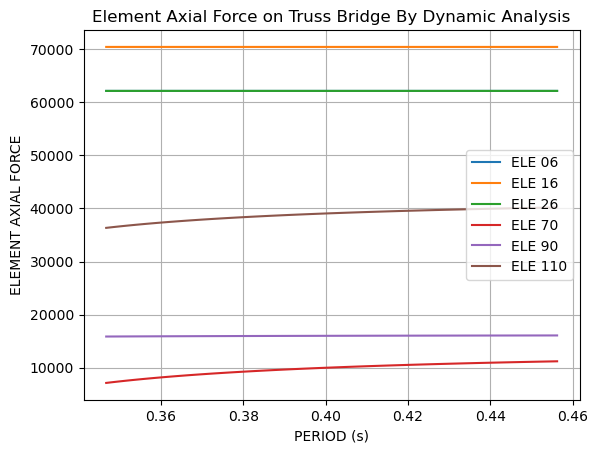

In [30]:
# Data usage
x = period
y_list = [
    Dyn_eleForce06,
    Dyn_eleForce16,
    Dyn_eleForce26,
    Dyn_eleForce70, 
    Dyn_eleForce90,
    Dyn_eleForce110
]

XLABEL = 'PERIOD (s)'
YLABEL = 'ELEMENT AXIAL FORCE'
TITLE = 'Element Axial Force on Truss Bridge By Dynamic Analysis'
LABELS = ['ELE 06', 'ELE 16','ELE 26', 'ELE 70', 'ELE 90', 'ELE 110']
plot_multiple_lines(x, y_list, LABELS, XLABEL, YLABEL, TITLE)

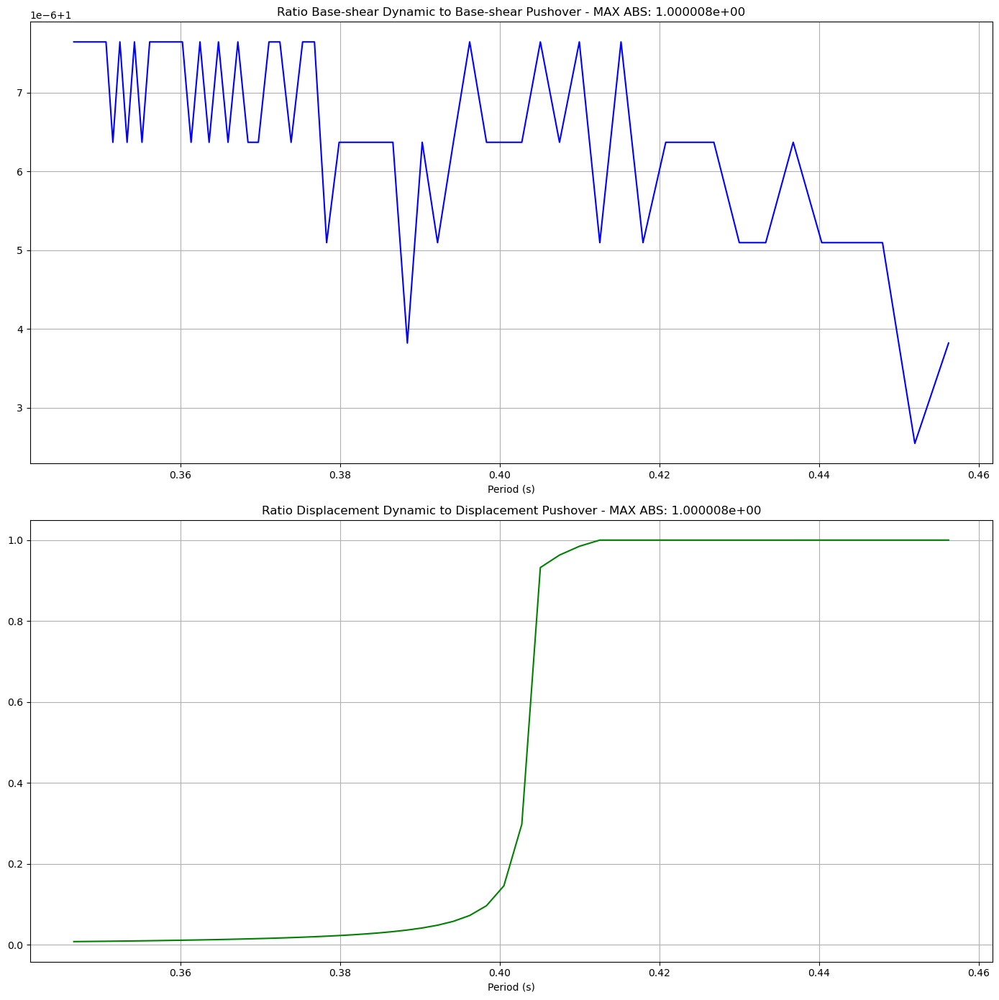

In [48]:
xlabel = 'Period (s)'
y1label = 'Ratio Base-shear Dynamic to Base-shear Pushover'
y2label = 'Ratio Displacement Dynamic to Displacement Pushover'
PLOT_TIME_HIS(period, xlabel, bDbP, y1label, dDdP, y2label, _, _, _, _, Z = 2, LOGX = 0, LOGY = 0)

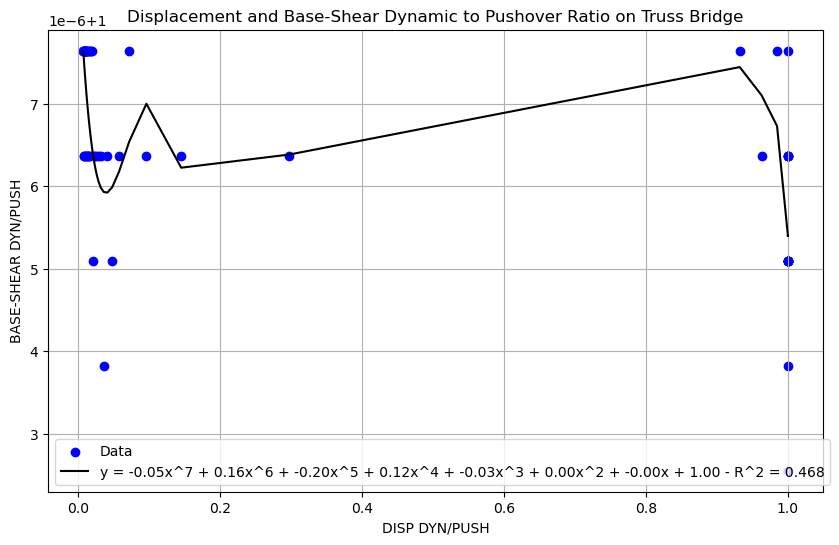

In [32]:
# Data usage
X = dDdP
Y = bDbP
XLABEL = 'DISP DYN/PUSH'
YLABEL = 'BASE-SHEAR DYN/PUSH'
TITLE = 'Displacement and Base-Shear Dynamic to Pushover Ratio on Truss Bridge'
COLOR = 'BLUE'
PLOT_SCATTER(X, Y, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 7)

-------------------------


C:\ProgramData\Anaconda3\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Box-Chart Datas: 
Minimum: 300.0000
First quartile: 325.0000
Median: 350.0000
Mean: 350.0000
Std: 29.3527
Third quartile: 375.0000
Maximum: 400.0000
Skewness: -0.0000
kurtosis: -1.2007
90% Confidence Interval: (305.0000, 395.0000)
-------------------------


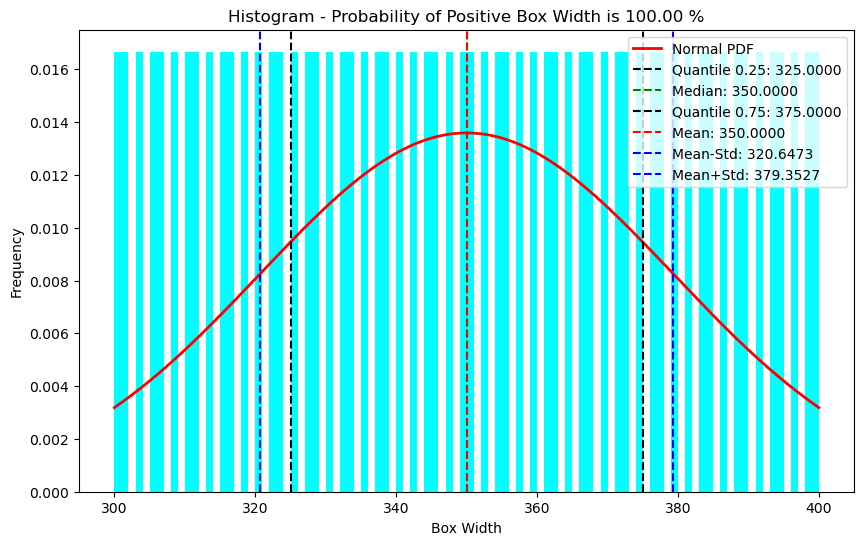

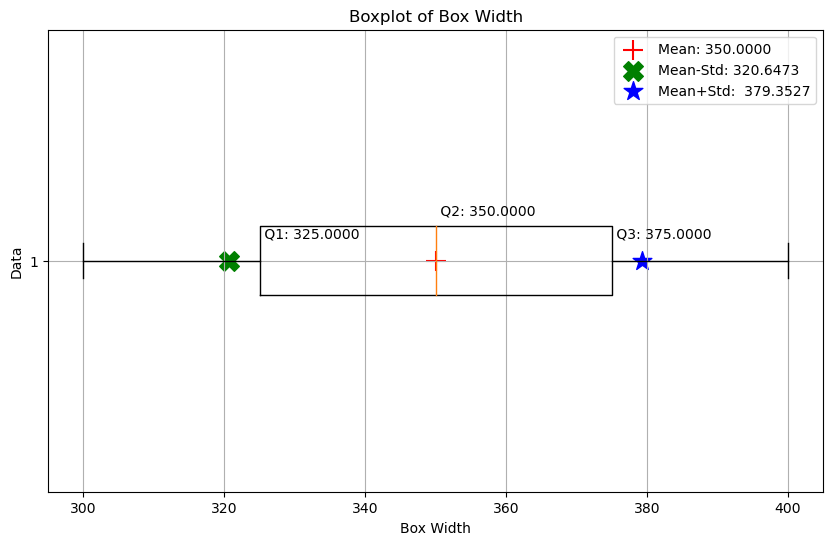

In [33]:
HISROGRAM_BOXPLOT(B_01, HISTO_COLOR='cyan', LABEL='Box Width')

-------------------------
Box-Chart Datas: 
Minimum: 8.0000
First quartile: 11.0000
Median: 14.0000
Mean: 14.0000
Std: 3.5223
Third quartile: 17.0000
Maximum: 20.0000
Skewness: 0.0000
kurtosis: -1.2007
90% Confidence Interval: (8.6000, 19.4000)
-------------------------


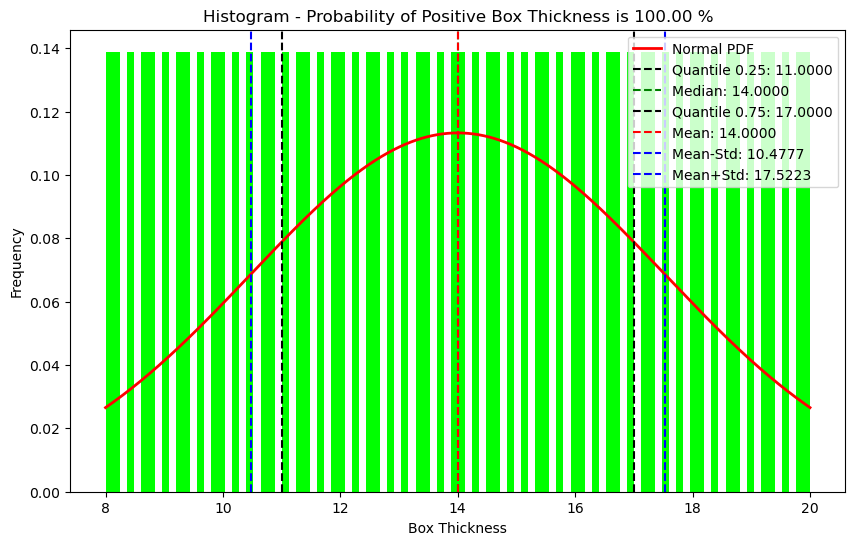

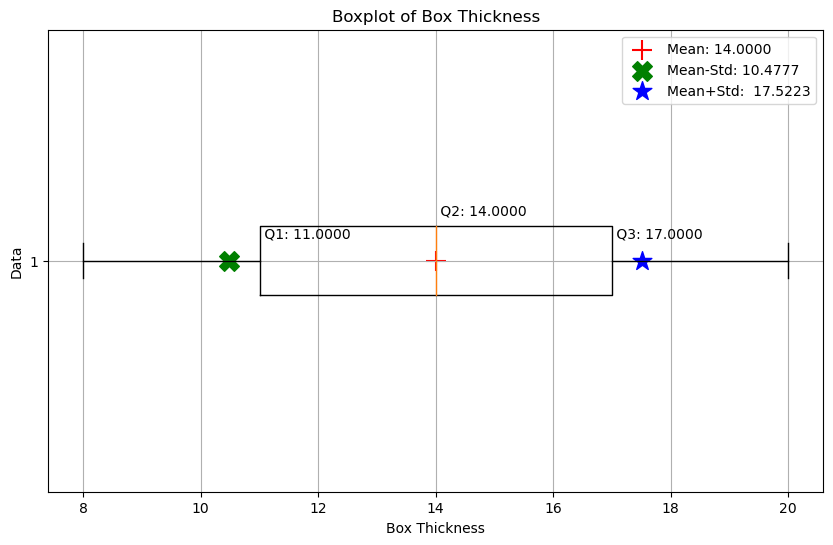

In [61]:
HISROGRAM_BOXPLOT(t_01, HISTO_COLOR='lime', LABEL='Box Thickness')

-------------------------


C:\ProgramData\Anaconda3\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Box-Chart Datas: 
Minimum: 32.7020
First quartile: 34.0551
Median: 36.0132
Mean: 36.8477
Std: 3.3083
Third quartile: 39.0902
Maximum: 44.5799
Skewness: 0.6857
kurtosis: -0.6218
90% Confidence Interval: (32.9381, 43.1658)
-------------------------


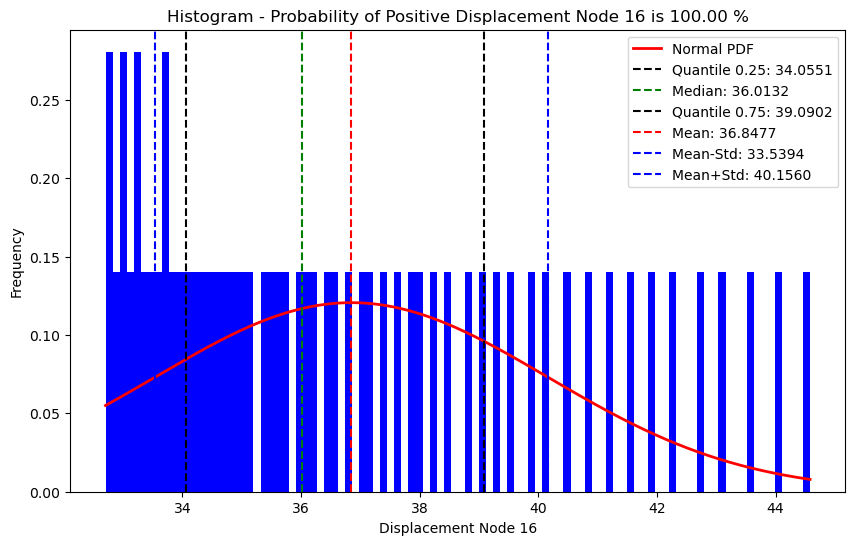

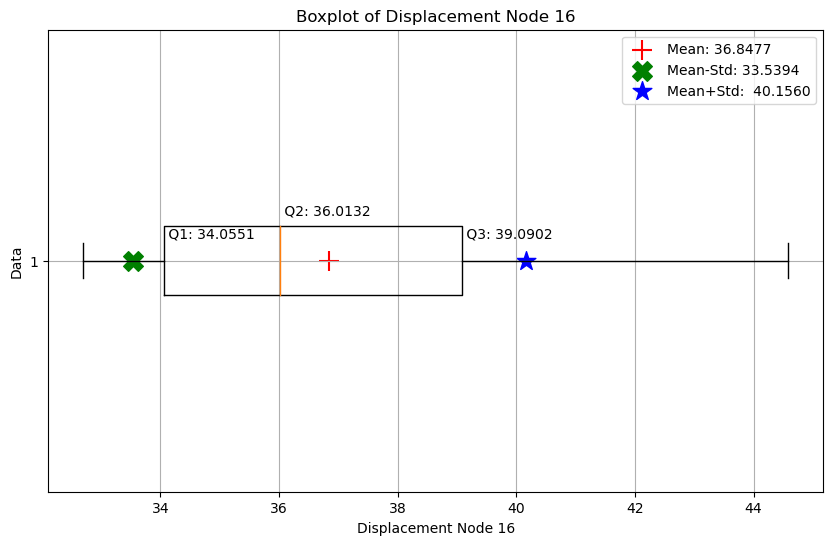

In [38]:
HISROGRAM_BOXPLOT(pgd, HISTO_COLOR='blue', LABEL='Displacement Node 16')

-------------------------
Box-Chart Datas: 
Minimum: 0.0058
First quartile: 0.0065
Median: 0.0070
Mean: 0.0070
Std: 0.0007
Third quartile: 0.0076
Maximum: 0.0082
Skewness: 0.0010
kurtosis: -0.9755
90% Confidence Interval: (0.0059, 0.0081)
-------------------------


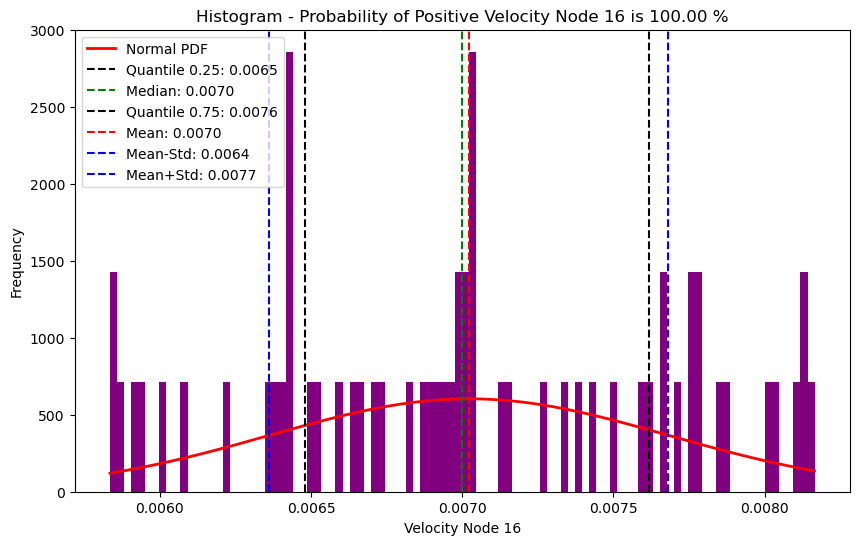

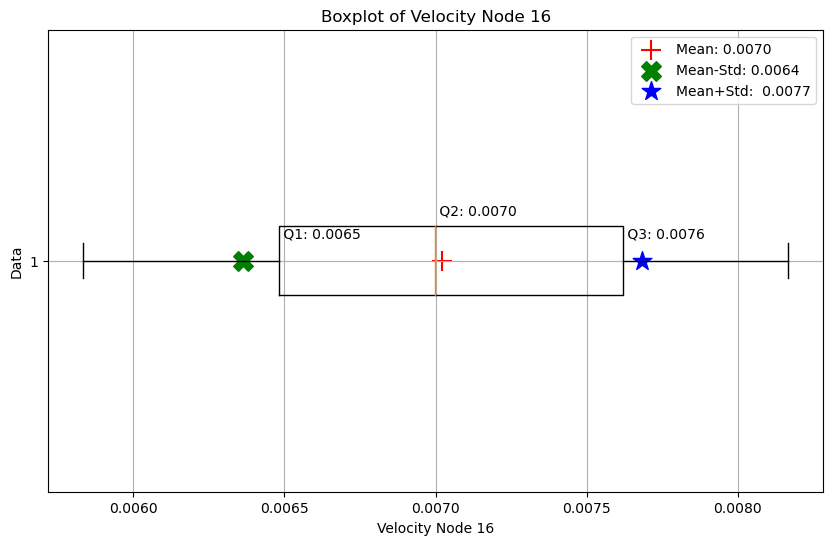

In [62]:
HISROGRAM_BOXPLOT(pgv, HISTO_COLOR='purple', LABEL='Velocity Node 16')

In [ ]:
HISROGRAM_BOXPLOT(pga, HISTO_COLOR='green', LABEL='Acceleration Node 16')

In [ ]:
HISROGRAM_BOXPLOT(pgb, HISTO_COLOR='orange', LABEL='Base-shear')

In [ ]:
HISROGRAM_BOXPLOT(diS, HISTO_COLOR='lime', LABEL='Structure Ductility Damage Index')

In [ ]:
HISROGRAM_BOXPLOT(diA06, HISTO_COLOR='pink', LABEL='Axial Ductility Damage Index Element 6')

In [ ]:
HISROGRAM_BOXPLOT(diA16, HISTO_COLOR='cyan', LABEL='Axial Ductility Damage Index Element 16')

In [ ]:
HISROGRAM_BOXPLOT(diA26, HISTO_COLOR='yellow', LABEL='Axial Ductility Damage Index Element 26')

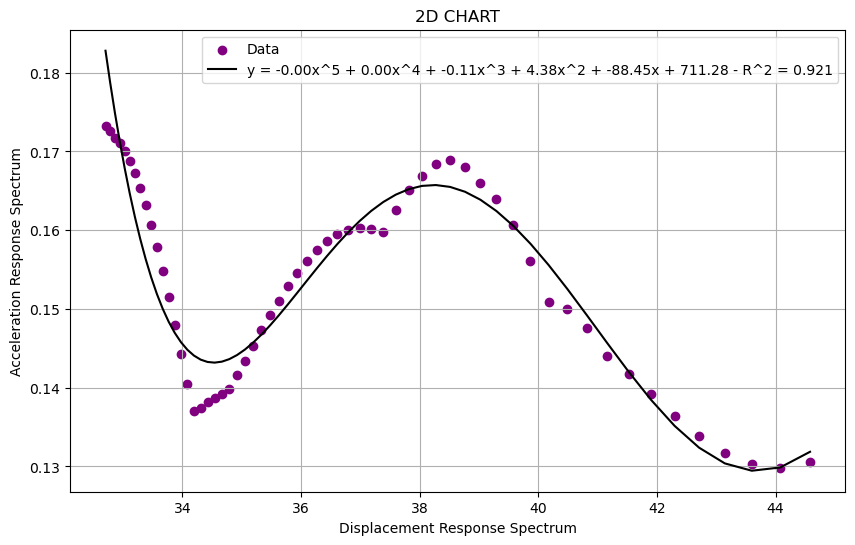

In [39]:
XLABEL = 'Displacement Response Spectrum'
YLABEL = 'Acceleration Response Spectrum'
TITLE = '2D CHART'
COLOR = 'purple'
PLOT_SCATTER(pgd, pga, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 5) 
PLOT_SCATTER_PLOTLY(pgd, pga, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 5) 
#plot_scatter_plotly(pgd, pga, XLABEL, YLABEL, TITLE, COLOR)

In [40]:
XLABEL = 'Displacement Response Spectrum'
YLABEL = 'Velocity Response Spectrum'
ZLABEL = 'Acceleration Response Spectrum'
TITLE = '3D CHART'
PLOT3D(pgd, pgv, pga, XLABEL, YLABEL, ZLABEL, TITLE)

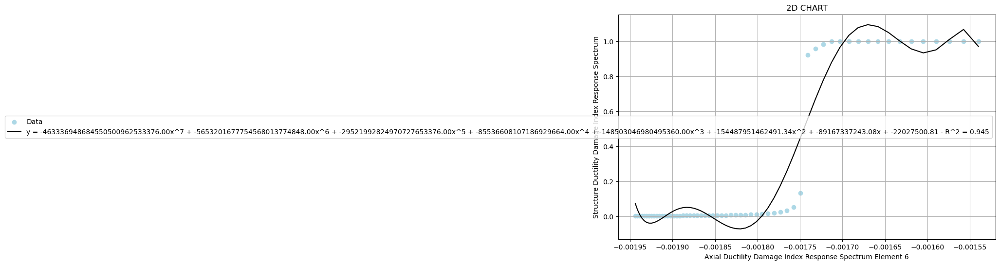

In [65]:
XLABEL = 'Axial Ductility Damage Index Response Spectrum Element 6'
YLABEL ='Structure Ductility Damage Index Response Spectrum'
TITLE = '2D CHART'
COLOR = 'lightblue'
PLOT_SCATTER(diA06, diS, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 7) 
#plot_scatter_plotly(diA06, diS, XLABEL, YLABEL, TITLE, COLOR)

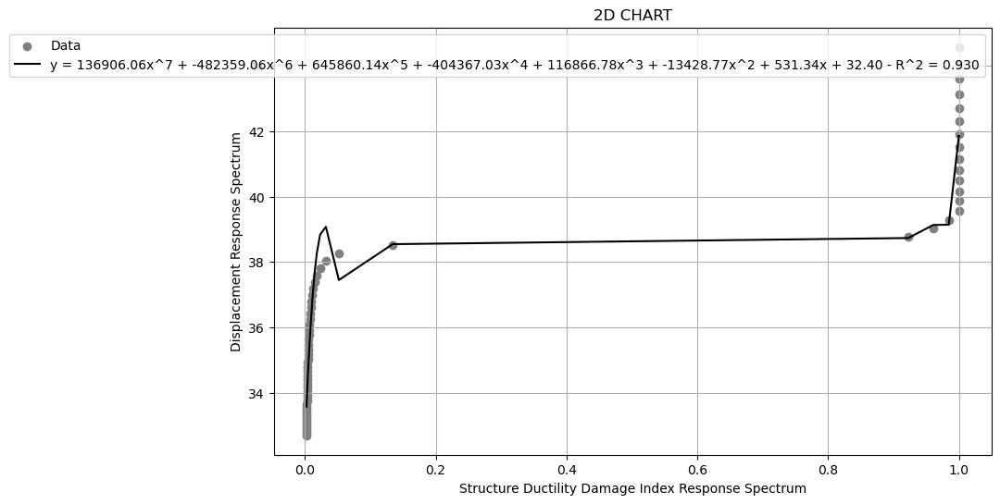

In [42]:
XLABEL = 'Structure Ductility Damage Index Response Spectrum'
YLABEL = 'Displacement Response Spectrum'
TITLE = '2D CHART'
COLOR = 'gray'
PLOT_SCATTER(diS, pgd, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 7) 
PLOT_SCATTER_PLOTLY(diS, pgd, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 7)
#plot_scatter_plotly(diS, pgd, XLABEL, YLABEL, TITLE, COLOR)

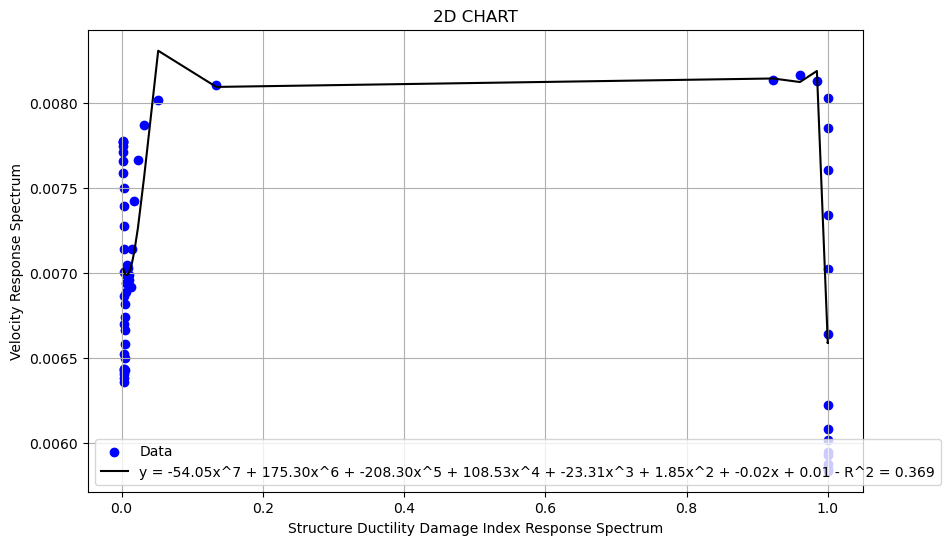

In [54]:
XLABEL = 'Structure Ductility Damage Index Response Spectrum'
YLABEL = 'Velocity Response Spectrum'
TITLE = '2D CHART'
COLOR = 'blue'
PLOT_SCATTER(diS, pgv, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 7) 
PLOT_SCATTER_PLOTLY(diS, pgv, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 7)
#plot_scatter_plotly(diS, pgv, XLABEL, YLABEL, TITLE, COLOR)

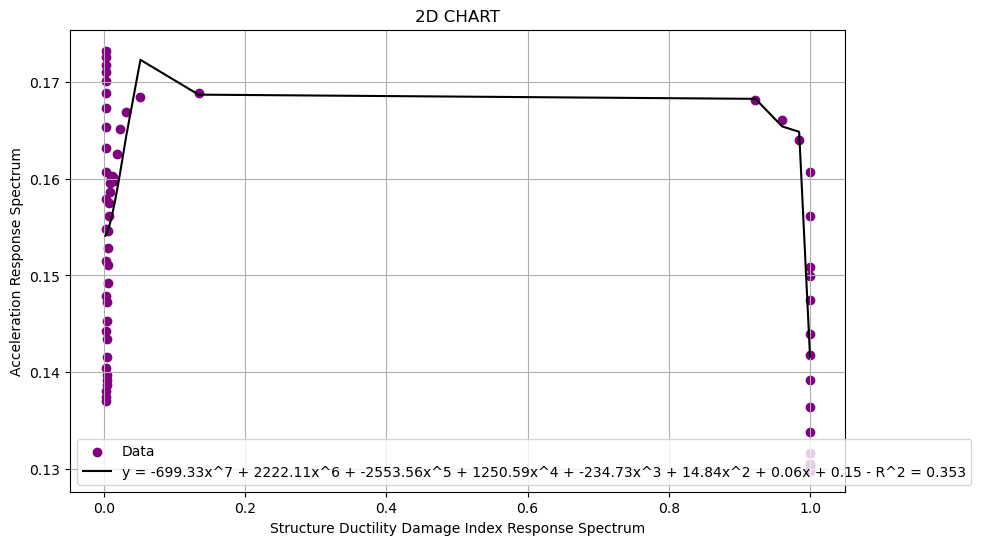

In [92]:
XLABEL = 'Structure Ductility Damage Index Response Spectrum'
YLABEL = 'Acceleration Response Spectrum'
TITLE = '2D CHART'
COLOR = 'purple'
PLOT_SCATTER(diS, pga, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 7) 
PLOT_SCATTER_PLOTLY(diS, pga, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 7)
#plot_scatter_plotly(diS, pga, XLABEL, YLABEL, TITLE, COLOR)

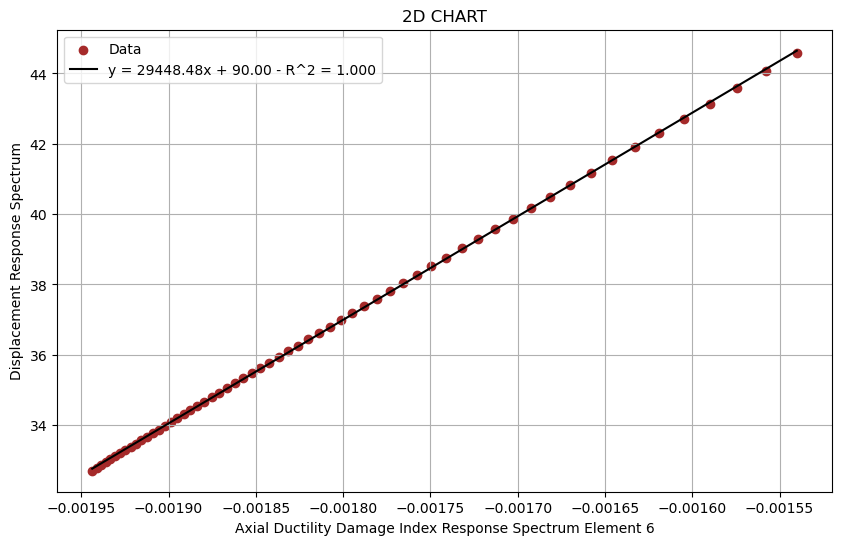

In [67]:
XLABEL = 'Axial Ductility Damage Index Response Spectrum Element 6'
YLABEL = 'Displacement Response Spectrum'
TITLE = '2D CHART'
COLOR = 'brown'
PLOT_SCATTER(diA06, pgd, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 1) 
PLOT_SCATTER_PLOTLY(diA06, pgd, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 1) 
#plot_scatter_plotly(diA06, pgd, XLABEL, YLABEL, TITLE, COLOR)

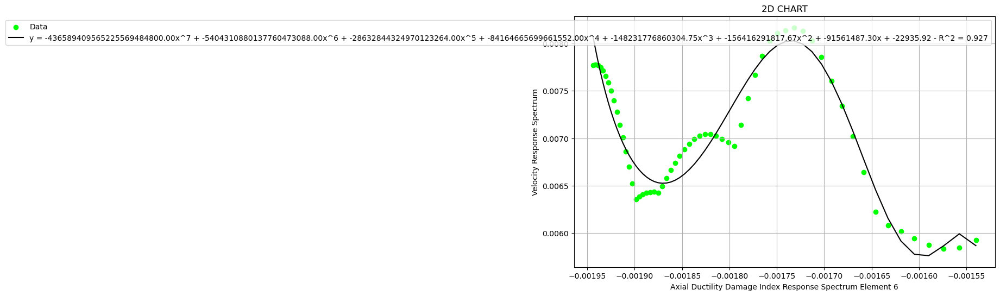

In [66]:
XLABEL = 'Axial Ductility Damage Index Response Spectrum Element 6'
YLABEL = 'Velocity Response Spectrum'
TITLE = '2D CHART'
COLOR = 'lime'
PLOT_SCATTER(diA06, pgv, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 7) 
PLOT_SCATTER_PLOTLY(diA06, pgv, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 7) 
#plot_scatter_plotly(diA06, pgv, XLABEL, YLABEL, TITLE, COLOR)

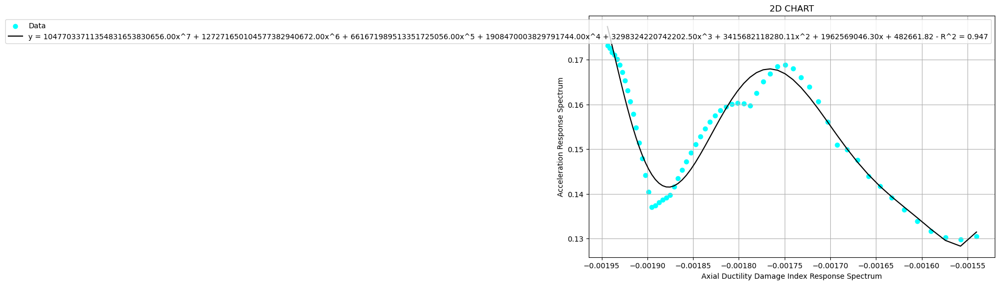

In [59]:
XLABEL = 'Axial Ductility Damage Index Response Spectrum Element 6'
YLABEL = 'Acceleration Response Spectrum'
TITLE = '2D CHART'
COLOR = 'cyan'
PLOT_SCATTER(diA06, pga, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 7) 
PLOT_SCATTER_PLOTLY(diA06, pga, XLABEL, YLABEL, TITLE, COLOR, LOG = 0, ORDER = 7) 
#plot_scatter_plotly(diA06, pga, XLABEL, YLABEL, TITLE, COLOR)

In [68]:
XLABEL = 'Axial Ductility Damage Index Response Spectrum Element 6'
YLABEL ='Structure Ductility Damage Index Response Spectrum'
ZLABEL ='Displacement Response Spectrum'
TITLE = '3D CHART'
PLOT3D(diA06, diS, pgd, XLABEL, YLABEL, ZLABEL, TITLE)

In [69]:
### LAST LOAD DATA
import numpy as np
## PYSHOVER ANALYSIS DATA
# Displacement Time History
DTHP = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'DTH_PUSH', 2, i, 2)
# Base Shear Time History 01
BTH01 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_PUSH_01', 2, i, 2)
# Base Shear Time History 11
BTH011 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_PUSH_11', 2, i, 2)
# Base Shear Time History 21
BTH021 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_PUSH_21', 2, i, 2)
# Base Shear Time History 31
BTH031 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_PUSH_31', 2, i, 2)
BTHP = abs(BTH01 + BTH011 + BTH021 + BTH031)

print(len(DTHP), len(BTHP))

## DYNAMAIC ANALYSIS DATA
# Displacement Time History
DTHD = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'DTH_DYN', 2, i, 2)
# Velocity Time History
VTH = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'VTH_DYN', 2, i, 2)
# Acceleration Time History
ATH = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'ATH_DYN', 2, i, 2)
# Base Shear Time History 01
BTH01 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_DYN_01', 2, i, 2)
# Base Shear Time History 11
BTH011 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_DYN_11', 2, i, 2)
# Base Shear Time History 21
BTH021 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_DYN_21', 2, i, 2)
# Base Shear Time History 31
BTH031 = OUTPUT_SECOND_COLUMN(FOLDER_NAME,'BTH_DYN_31', 2, i, 2)
# Total Base Shear
BTHD = BTH01 + BTH011 + BTH021 + BTH031

print(len(DTHD), len(VTH),len(ATH),len(BTHD))


1009 1009
1010 1010 1010 1010


1009
25146.84434692824


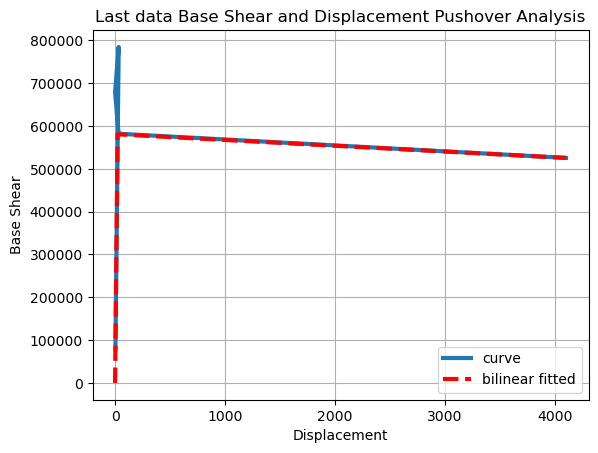

			 Structure Ductility Damage Index: 0.002


In [70]:
print(len(BTHP))
xx, yy, _, _, _, _, _ = BILNEAR_CURVE(abs(DTHP), abs(BTHP), 30)
print(yy[1]/ xx[1])
#demand_disp = MAXABS_FUN(DATA_FILE01, 1, i)# DEMAND DYNAMIC DISPLACEMENT
XLABEL = 'Displacement'
YLABEL = 'Base Shear'
TITLE = 'Last data Base Shear and Displacement Pushover Analysis'
COLOR = 'black'
PLOT_2D(abs(DTHP), abs(BTHP), xx, yy, XLABEL, YLABEL, TITLE, COLOR='black', Z=2) 
DIs = (demand_disp - xx[1]) / (xx[2] - xx[1])
print(f'\t\t\t Structure Ductility Damage Index: {DIs:.3f}')

1010


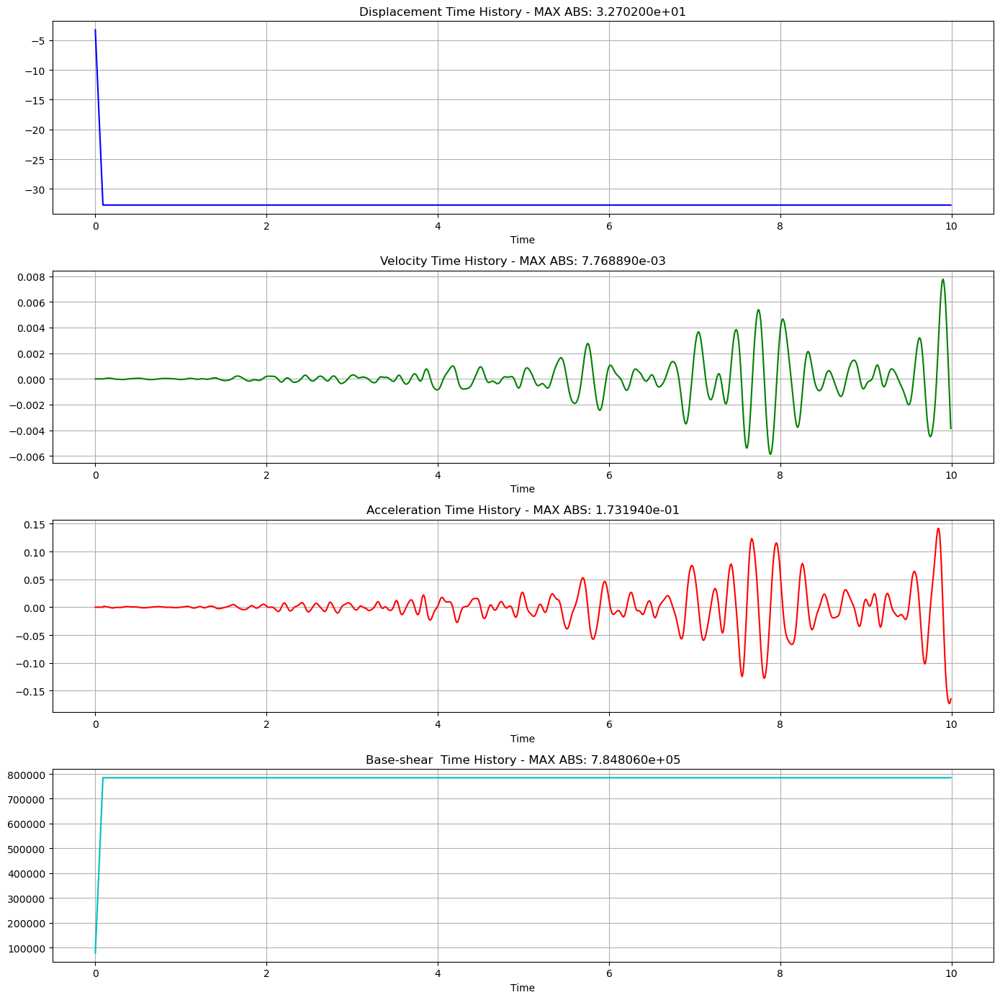

In [71]:
xlabel = 'Time'
y1label = 'Displacement Time History'
y2label = 'Velocity Time History'
y3label = 'Acceleration Time History'
y4label = 'Base-shear  Time History'
MAX_TIME = 10 # DATA MUST BE GOTTEN FROM GROUND MOTION TIME HISTORY
DT  = MAX_TIME / len(DTHD)
TIME = np.arange(0, MAX_TIME , DT)
print(len(TIME))
PLOT_TIME_HIS(TIME, xlabel, DTHD, y1label, VTH, y2label, ATH, y3label, BTHD, y4label, Z = 4, LOGX = 0, LOGY = 0)

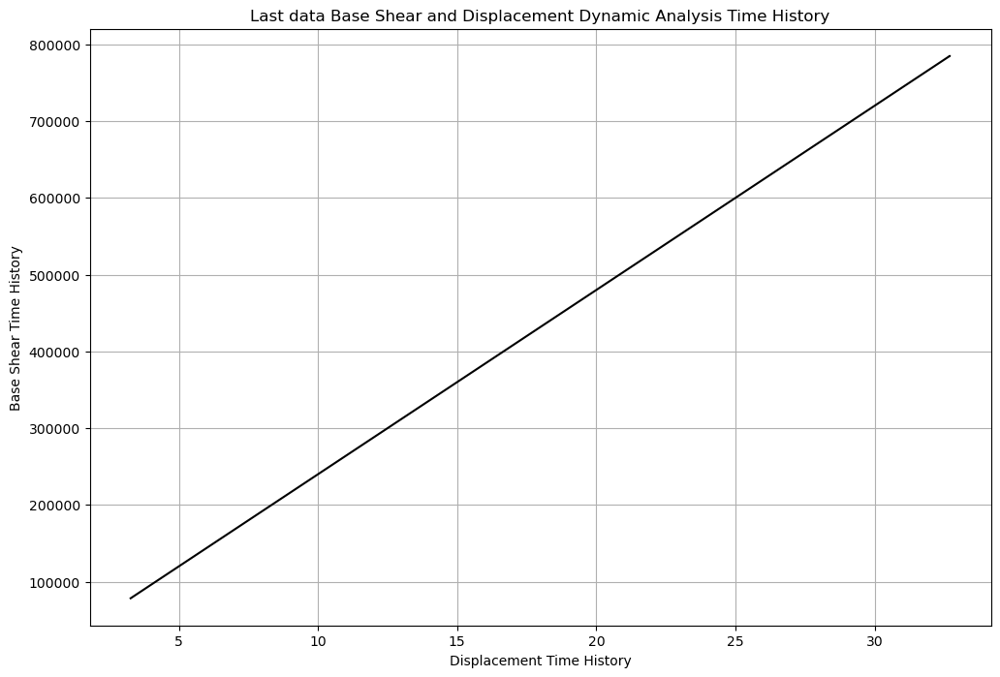

In [48]:
XLABEL = 'Displacement Time History'
YLABEL = 'Base Shear Time History'
TITLE = 'Last data Base Shear and Displacement Dynamic Analysis Time History'
COLOR = 'black'
PLOT_2D(abs(DTHD), abs(BTHD),_,_, XLABEL, YLABEL, TITLE, COLOR='black', Z=1) 

In [59]:
import pandas as pd
# Create a DataFrame
df = pd.DataFrame({'Section Box 1 Width': B_01,
                   'Section Box 1 Thickness': t_01,
                   'Structure Period': T,
                   'Displacement Response Spectrum': pgd,
                   'Velocity Response Spectrum': pgv,
                   'Acceleration Response Spectrum': pga,
                   'Base-shear Response Spectrum': pgb,
                   'Structure Ductility Damage Index Response Spectrum': diS,
                   'Axial Ductility Damage Index Response Spectrum Element 6':diA06,
                   'Axial Ductility Damage Index Response Spectrum Element 16':diA16})
print(df)
# PLOT HEATMAP FOR CORRELATION 
PLOT_HEATMAP(df) 

    Section Box 1 Width  Section Box 1 Thickness  Structure Period  \
0            300.000000                 8.000000          0.456210   
1            301.694915                 8.203390          0.451985   
2            303.389831                 8.406780          0.447938   
3            305.084746                 8.610169          0.444056   
4            306.779661                 8.813559          0.440331   
5            308.474576                 9.016949          0.436754   
6            310.169492                 9.220339          0.433314   
7            311.864407                 9.423729          0.430006   
8            313.559322                 9.627119          0.426822   
9            315.254237                 9.830508          0.423754   
10           316.949153                10.033898          0.420798   
11           318.644068                10.237288          0.417947   
12           320.338983                10.440678          0.415195   
13           322.033

In [60]:
### Multiple Regression Model
def Multiple_Regression(df):
    import statsmodels.api as sm
    # Add a constant term for the intercept
    X = sm.add_constant(df[['Section Box 1 Width',
                            'Section Box 1 Thickness',
                            'Structure Period',
                            'Displacement Response Spectrum',
                            'Velocity Response Spectrum',
                            'Acceleration Response Spectrum',
                            'Base-shear Response Spectrum',
                            'Axial Ductility Damage Index Response Spectrum Element 6',
                            'Axial Ductility Damage Index Response Spectrum Element 16']])

    # Fit the multiple regression model
    model = sm.OLS(df['Structure Ductility Damage Index Response Spectrum'], X).fit()

    # Print the summary
    print(model.summary())

Multiple_Regression(df)   

                                            OLS Regression Results                                            
Dep. Variable:     Structure Ductility Damage Index Response Spectrum   R-squared:                       0.929
Model:                                                            OLS   Adj. R-squared:                  0.918
Method:                                                 Least Squares   F-statistic:                     83.37
Date:                                                Thu, 15 Aug 2024   Prob (F-statistic):           1.44e-26
Time:                                                        09:59:56   Log-Likelihood:                 43.065
No. Observations:                                                  60   AIC:                            -68.13
Df Residuals:                                                      51   BIC:                            -49.28
Df Model:                                                           8                                         
C

In [82]:
print(max(diA70))

-0.0019919452087130704


Epoch 1/500
30/30 - 2s - 52ms/step - loss: 3.7355e-06
Epoch 2/500
30/30 - 0s - 5ms/step - loss: 1.9759e-06
Epoch 3/500
30/30 - 0s - 5ms/step - loss: 2.1465e-06
Epoch 4/500
30/30 - 0s - 12ms/step - loss: 2.2666e-06
Epoch 5/500
30/30 - 0s - 5ms/step - loss: 1.8996e-06
Epoch 6/500
30/30 - 0s - 6ms/step - loss: 1.9957e-06
Epoch 7/500
30/30 - 0s - 6ms/step - loss: 2.5800e-06
Epoch 8/500
30/30 - 0s - 5ms/step - loss: 1.7461e-06
Epoch 9/500
30/30 - 0s - 5ms/step - loss: 1.9962e-06
Epoch 10/500
30/30 - 0s - 6ms/step - loss: 2.4041e-06
Epoch 11/500
30/30 - 0s - 5ms/step - loss: 1.8011e-06
Epoch 12/500
30/30 - 0s - 5ms/step - loss: 1.6220e-06
Epoch 13/500
30/30 - 0s - 5ms/step - loss: 2.3229e-06
Epoch 14/500
30/30 - 0s - 5ms/step - loss: 2.2585e-06
Epoch 15/500
30/30 - 0s - 6ms/step - loss: 2.5010e-06
Epoch 16/500
30/30 - 0s - 6ms/step - loss: 1.4998e-06
Epoch 17/500
30/30 - 0s - 5ms/step - loss: 2.1339e-06
Epoch 18/500
30/30 - 0s - 6ms/step - loss: 1.9428e-06
Epoch 19/500
30/30 - 0s - 6ms/step 

Epoch 152/500
30/30 - 0s - 12ms/step - loss: 1.6558e-06
Epoch 153/500
30/30 - 0s - 7ms/step - loss: 1.4233e-06
Epoch 154/500
30/30 - 0s - 8ms/step - loss: 1.8044e-06
Epoch 155/500
30/30 - 0s - 8ms/step - loss: 1.8806e-06
Epoch 156/500
30/30 - 0s - 11ms/step - loss: 1.7305e-06
Epoch 157/500
30/30 - 0s - 6ms/step - loss: 2.2540e-06
Epoch 158/500
30/30 - 0s - 5ms/step - loss: 1.8311e-06
Epoch 159/500
30/30 - 0s - 7ms/step - loss: 1.5911e-06
Epoch 160/500
30/30 - 0s - 7ms/step - loss: 2.2364e-06
Epoch 161/500
30/30 - 0s - 11ms/step - loss: 1.7527e-06
Epoch 162/500
30/30 - 0s - 8ms/step - loss: 1.5658e-06
Epoch 163/500
30/30 - 0s - 6ms/step - loss: 2.5589e-06
Epoch 164/500
30/30 - 0s - 6ms/step - loss: 1.8931e-06
Epoch 165/500
30/30 - 0s - 7ms/step - loss: 2.9410e-06
Epoch 166/500
30/30 - 0s - 11ms/step - loss: 1.9941e-06
Epoch 167/500
30/30 - 0s - 5ms/step - loss: 3.0449e-06
Epoch 168/500
30/30 - 0s - 5ms/step - loss: 1.4081e-06
Epoch 169/500
30/30 - 0s - 6ms/step - loss: 1.6147e-06
Epoch 

Epoch 301/500
30/30 - 0s - 11ms/step - loss: 1.5155e-06
Epoch 302/500
30/30 - 0s - 5ms/step - loss: 1.4325e-06
Epoch 303/500
30/30 - 0s - 6ms/step - loss: 2.0308e-06
Epoch 304/500
30/30 - 0s - 11ms/step - loss: 1.5816e-06
Epoch 305/500
30/30 - 0s - 5ms/step - loss: 1.7708e-06
Epoch 306/500
30/30 - 0s - 5ms/step - loss: 1.7361e-06
Epoch 307/500
30/30 - 0s - 8ms/step - loss: 1.5173e-06
Epoch 308/500
30/30 - 0s - 5ms/step - loss: 1.7440e-06
Epoch 309/500
30/30 - 0s - 5ms/step - loss: 1.5469e-06
Epoch 310/500
30/30 - 0s - 5ms/step - loss: 1.4446e-06
Epoch 311/500
30/30 - 0s - 5ms/step - loss: 3.2058e-06
Epoch 312/500
30/30 - 0s - 5ms/step - loss: 1.4708e-06
Epoch 313/500
30/30 - 0s - 5ms/step - loss: 2.3668e-06
Epoch 314/500
30/30 - 0s - 6ms/step - loss: 1.8924e-06
Epoch 315/500
30/30 - 0s - 11ms/step - loss: 1.6826e-06
Epoch 316/500
30/30 - 0s - 5ms/step - loss: 1.6971e-06
Epoch 317/500
30/30 - 0s - 5ms/step - loss: 1.4860e-06
Epoch 318/500
30/30 - 0s - 5ms/step - loss: 1.5361e-06
Epoch 3

Epoch 450/500
30/30 - 0s - 6ms/step - loss: 1.7607e-06
Epoch 451/500
30/30 - 0s - 6ms/step - loss: 1.8955e-06
Epoch 452/500
30/30 - 0s - 6ms/step - loss: 1.5691e-06
Epoch 453/500
30/30 - 0s - 6ms/step - loss: 3.5197e-06
Epoch 454/500
30/30 - 0s - 6ms/step - loss: 1.5277e-06
Epoch 455/500
30/30 - 0s - 6ms/step - loss: 1.7237e-06
Epoch 456/500
30/30 - 0s - 6ms/step - loss: 2.2348e-06
Epoch 457/500
30/30 - 0s - 6ms/step - loss: 1.8651e-06
Epoch 458/500
30/30 - 0s - 5ms/step - loss: 2.0729e-06
Epoch 459/500
30/30 - 0s - 6ms/step - loss: 1.6463e-06
Epoch 460/500
30/30 - 0s - 6ms/step - loss: 1.6777e-06
Epoch 461/500
30/30 - 0s - 7ms/step - loss: 1.5559e-06
Epoch 462/500
30/30 - 0s - 7ms/step - loss: 1.3540e-06
Epoch 463/500
30/30 - 0s - 6ms/step - loss: 1.7846e-06
Epoch 464/500
30/30 - 0s - 6ms/step - loss: 1.5470e-06
Epoch 465/500
30/30 - 0s - 6ms/step - loss: 1.4887e-06
Epoch 466/500
30/30 - 0s - 6ms/step - loss: 1.5255e-06
Epoch 467/500
30/30 - 0s - 6ms/step - loss: 1.6003e-06
Epoch 468/

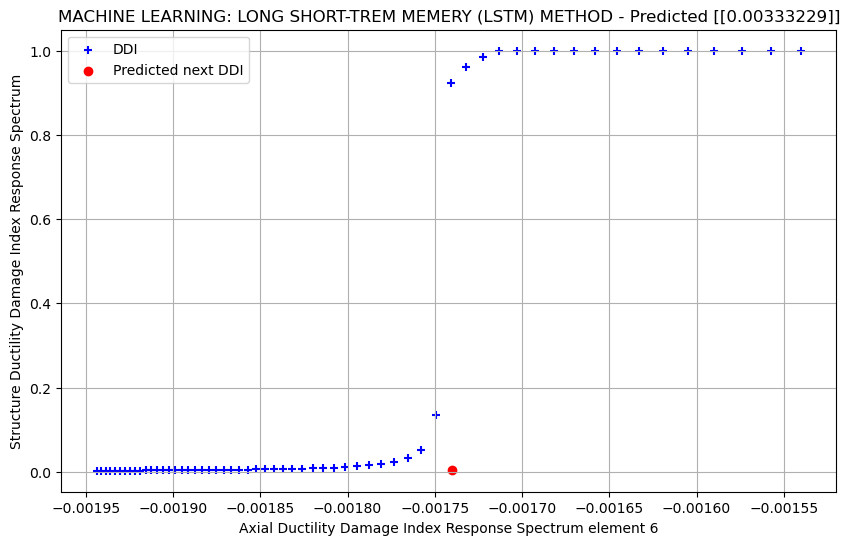

In [87]:
x = diA06 # Axial Ductility Damage Index Response Spectrum element 6
y = diS # Structure Ductility Damage Index Response Spectrum
predicted_y = PREDICT_LSTM(x, y, look_back = 30, ITERATION = 500)

# Plot the results
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.scatter(x, y, color='blue', marker='+', label='DDI')
plt.scatter(-0.00174, predicted_y, color='red', marker='o', label='Predicted next DDI')
plt.title(f'MACHINE LEARNING: LONG SHORT-TREM MEMERY (LSTM) METHOD - Predicted {predicted_y}')
plt.xlabel('Axial Ductility Damage Index Response Spectrum element 6')
plt.ylabel('Structure Ductility Damage Index Response Spectrum')
plt.legend()
plt.grid()
plt.show()

Epoch 1/100
10/10 - 1s - 131ms/step - loss: 1.9422e-06
Epoch 2/100
10/10 - 0s - 8ms/step - loss: 7.3181e-07
Epoch 3/100
10/10 - 0s - 8ms/step - loss: 2.1197e-07
Epoch 4/100
10/10 - 0s - 9ms/step - loss: 1.6761e-07
Epoch 5/100
10/10 - 0s - 8ms/step - loss: 2.4463e-07
Epoch 6/100
10/10 - 0s - 9ms/step - loss: 1.0448e-07
Epoch 7/100
10/10 - 0s - 8ms/step - loss: 6.7168e-08
Epoch 8/100
10/10 - 0s - 9ms/step - loss: 6.4522e-08
Epoch 9/100
10/10 - 0s - 9ms/step - loss: 5.0791e-08
Epoch 10/100
10/10 - 0s - 9ms/step - loss: 8.4726e-08
Epoch 11/100
10/10 - 0s - 9ms/step - loss: 7.5971e-08
Epoch 12/100
10/10 - 0s - 8ms/step - loss: 2.0248e-07
Epoch 13/100
10/10 - 0s - 9ms/step - loss: 5.5882e-08
Epoch 14/100
10/10 - 0s - 8ms/step - loss: 1.3568e-07
Epoch 15/100
10/10 - 0s - 9ms/step - loss: 1.1356e-07
Epoch 16/100
10/10 - 0s - 8ms/step - loss: 9.0800e-08
Epoch 17/100
10/10 - 0s - 9ms/step - loss: 2.4977e-07
Epoch 18/100
10/10 - 0s - 8ms/step - loss: 1.1369e-07
Epoch 19/100
10/10 - 0s - 9ms/step 

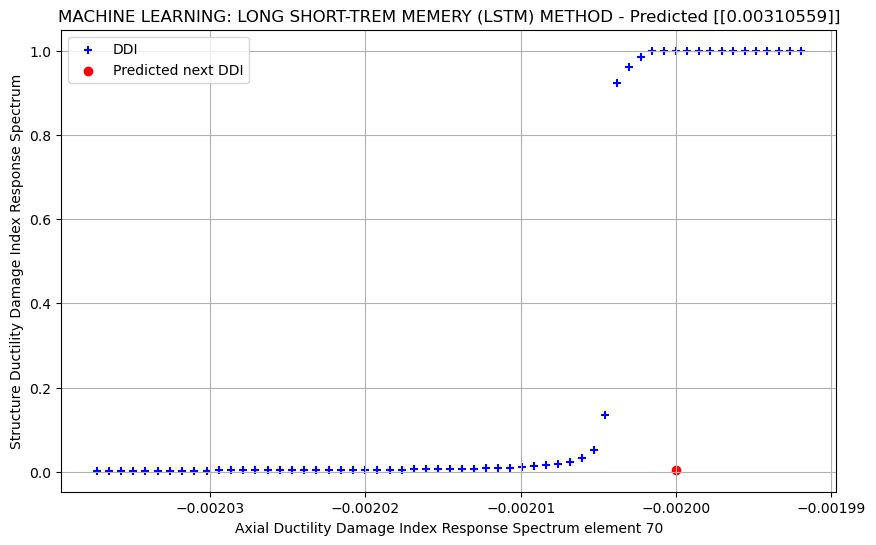

In [83]:
x = diA70 # Axial Ductility Damage Index Response Spectrum element 70
y = diS # Structure Ductility Damage Index Response Spectrum
predicted_y = PREDICT_LSTM(x, y, look_back = 30, ITERATION = 500)

# Plot the results
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.scatter(x, y, color='blue', marker='+', label='DDI')
plt.scatter(-0.002, predicted_y, color='red', marker='o', label='Predicted next DDI')
plt.title(f'MACHINE LEARNING: LONG SHORT-TREM MEMERY (LSTM) METHOD - Predicted {predicted_y}')
plt.xlabel('Axial Ductility Damage Index Response Spectrum element 70')
plt.ylabel('Structure Ductility Damage Index Response Spectrum')
plt.legend()
plt.grid()
plt.show()

Epoch 1/500
30/30 - 3s - 111ms/step - loss: 1162.6804
Epoch 2/500
30/30 - 0s - 15ms/step - loss: 1151.9241
Epoch 3/500
30/30 - 0s - 11ms/step - loss: 1122.9449
Epoch 4/500
30/30 - 0s - 16ms/step - loss: 1091.2625
Epoch 5/500
30/30 - 0s - 12ms/step - loss: 1069.9178
Epoch 6/500
30/30 - 0s - 9ms/step - loss: 1050.6830
Epoch 7/500
30/30 - 0s - 10ms/step - loss: 1033.1263
Epoch 8/500
30/30 - 0s - 12ms/step - loss: 1016.5680
Epoch 9/500
30/30 - 0s - 12ms/step - loss: 1000.8369
Epoch 10/500
30/30 - 0s - 12ms/step - loss: 985.8476
Epoch 11/500
30/30 - 0s - 14ms/step - loss: 971.6273
Epoch 12/500
30/30 - 1s - 20ms/step - loss: 958.0367
Epoch 13/500
30/30 - 0s - 12ms/step - loss: 945.0411
Epoch 14/500
30/30 - 0s - 8ms/step - loss: 932.5536
Epoch 15/500
30/30 - 0s - 13ms/step - loss: 920.5543
Epoch 16/500
30/30 - 0s - 11ms/step - loss: 908.9240
Epoch 17/500
30/30 - 0s - 11ms/step - loss: 897.6290
Epoch 18/500
30/30 - 0s - 8ms/step - loss: 886.6844
Epoch 19/500
30/30 - 0s - 8ms/step - loss: 876.0

Epoch 156/500
30/30 - 0s - 11ms/step - loss: 133.8587
Epoch 157/500
30/30 - 0s - 11ms/step - loss: 131.3230
Epoch 158/500
30/30 - 0s - 8ms/step - loss: 128.8215
Epoch 159/500
30/30 - 0s - 11ms/step - loss: 126.3469
Epoch 160/500
30/30 - 0s - 12ms/step - loss: 123.9104
Epoch 161/500
30/30 - 0s - 8ms/step - loss: 121.4955
Epoch 162/500
30/30 - 0s - 13ms/step - loss: 119.1100
Epoch 163/500
30/30 - 0s - 12ms/step - loss: 116.7650
Epoch 164/500
30/30 - 0s - 12ms/step - loss: 114.4478
Epoch 165/500
30/30 - 0s - 9ms/step - loss: 112.1525
Epoch 166/500
30/30 - 0s - 12ms/step - loss: 109.8938
Epoch 167/500
30/30 - 0s - 11ms/step - loss: 107.6625
Epoch 168/500
30/30 - 0s - 12ms/step - loss: 105.4653
Epoch 169/500
30/30 - 0s - 11ms/step - loss: 103.2885
Epoch 170/500
30/30 - 0s - 8ms/step - loss: 101.1545
Epoch 171/500
30/30 - 0s - 13ms/step - loss: 99.0391
Epoch 172/500
30/30 - 0s - 7ms/step - loss: 96.9517
Epoch 173/500
30/30 - 0s - 14ms/step - loss: 94.8942
Epoch 174/500
30/30 - 0s - 10ms/step

30/30 - 0s - 8ms/step - loss: 1.0298
Epoch 313/500
30/30 - 0s - 14ms/step - loss: 1.0146
Epoch 314/500
30/30 - 0s - 11ms/step - loss: 1.0046
Epoch 315/500
30/30 - 0s - 8ms/step - loss: 0.9977
Epoch 316/500
30/30 - 0s - 13ms/step - loss: 0.9887
Epoch 317/500
30/30 - 0s - 11ms/step - loss: 0.9828
Epoch 318/500
30/30 - 0s - 11ms/step - loss: 0.9737
Epoch 319/500
30/30 - 0s - 8ms/step - loss: 0.9679
Epoch 320/500
30/30 - 0s - 13ms/step - loss: 0.9631
Epoch 321/500
30/30 - 0s - 10ms/step - loss: 0.9582
Epoch 322/500
30/30 - 0s - 13ms/step - loss: 0.9527
Epoch 323/500
30/30 - 0s - 10ms/step - loss: 0.9488
Epoch 324/500
30/30 - 0s - 11ms/step - loss: 0.9462
Epoch 325/500
30/30 - 0s - 13ms/step - loss: 0.9429
Epoch 326/500
30/30 - 0s - 10ms/step - loss: 0.9389
Epoch 327/500
30/30 - 0s - 13ms/step - loss: 0.9364
Epoch 328/500
30/30 - 0s - 10ms/step - loss: 0.9354
Epoch 329/500
30/30 - 0s - 13ms/step - loss: 0.9340
Epoch 330/500
30/30 - 0s - 13ms/step - loss: 0.9306
Epoch 331/500
30/30 - 0s - 10

Epoch 471/500
30/30 - 0s - 14ms/step - loss: 0.9221
Epoch 472/500
30/30 - 0s - 8ms/step - loss: 0.9194
Epoch 473/500
30/30 - 0s - 12ms/step - loss: 0.9178
Epoch 474/500
30/30 - 0s - 12ms/step - loss: 0.9182
Epoch 475/500
30/30 - 0s - 12ms/step - loss: 0.9232
Epoch 476/500
30/30 - 0s - 12ms/step - loss: 0.9172
Epoch 477/500
30/30 - 0s - 12ms/step - loss: 0.9203
Epoch 478/500
30/30 - 0s - 14ms/step - loss: 0.9254
Epoch 479/500
30/30 - 0s - 12ms/step - loss: 0.9193
Epoch 480/500
30/30 - 0s - 12ms/step - loss: 0.9187
Epoch 481/500
30/30 - 0s - 12ms/step - loss: 0.9193
Epoch 482/500
30/30 - 0s - 10ms/step - loss: 0.9204
Epoch 483/500
30/30 - 0s - 11ms/step - loss: 0.9187
Epoch 484/500
30/30 - 0s - 13ms/step - loss: 0.9169
Epoch 485/500
30/30 - 0s - 8ms/step - loss: 0.9185
Epoch 486/500
30/30 - 0s - 11ms/step - loss: 0.9184
Epoch 487/500
30/30 - 0s - 13ms/step - loss: 0.9185
Epoch 488/500
30/30 - 0s - 7ms/step - loss: 0.9174
Epoch 489/500
30/30 - 0s - 14ms/step - loss: 0.9203
Epoch 490/500
3

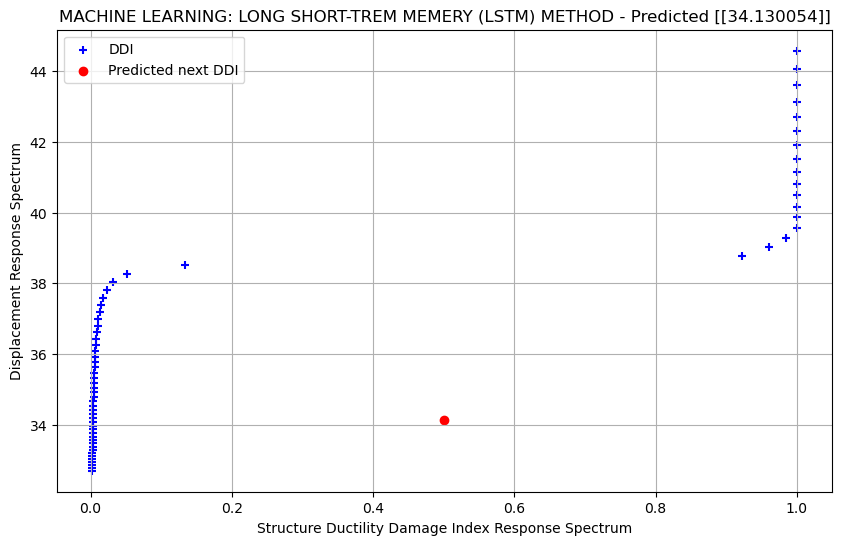

In [89]:
x = diS  # Structure Ductility Damage Index Response Spectrum
y = pgd  # Displacement Response Spectrum
predicted_y = PREDICT_LSTM(x, y, look_back = 30, ITERATION = 500)

# Plot the results
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.scatter(x, y, color='blue', marker='+', label='DDI')
plt.scatter(0.50, predicted_y, color='red', marker='o', label='Predicted next DDI')
plt.title(f'MACHINE LEARNING: LONG SHORT-TREM MEMERY (LSTM) METHOD - Predicted {predicted_y}')
plt.xlabel('Structure Ductility Damage Index Response Spectrum')
plt.ylabel('Displacement Response Spectrum')
plt.legend()
plt.grid()
plt.show()